In [1]:
!pip install ydata_profiling

Defaulting to user installation because normal site-packages is not writeable


In [3]:
pip install ydata-sdk

Defaulting to user installation because normal site-packages is not writeable
  Using cached urllib3-1.26.20-py2.py3-none-any.whl.metadata (50 kB)
Using cached urllib3-1.26.20-py2.py3-none-any.whl (144 kB)
  Attempting uninstall: urllib3
    Found existing installation: urllib3 2.5.0
    Uninstalling urllib3-2.5.0:
      Successfully uninstalled urllib3-2.5.0
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
selenium 4.35.0 requires urllib3[socks]<3.0,>=2.5.0, but you have urllib3 1.26.20 which is incompatible.
conda-repo-cli 1.0.114 requires urllib3>=2.2.2, but you have urllib3 1.26.20 which is incompatible.


In [10]:
# Core libraries
import pandas as pd
import numpy as np

from ydata_profiling import ProfileReport
%matplotlib inline
# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import sqlite3
from scipy import stats
from scipy.stats import zscore
import warnings
warnings.filterwarnings("ignore")

# Display settings
pd.set_option("display.max_columns", None)

In [3]:
# Load CSV file (replace filename with your actual dataset path)
df = pd.read_csv("OLA.csv")

# Quick look
print(df.shape)   # rows & cols
df.head()

(103024, 20)


,Date,Time,Booking_ID,Booking_Status,Customer_ID,Vehicle_Type,Pickup_Location,Drop_Location,V_TAT,C_TAT,Canceled_Rides_by_Customer,Canceled_Rides_by_Driver,Incomplete_Rides,Incomplete_Rides_Reason,Booking_Value,Payment_Method,Ride_Distance,Driver_Ratings,Customer_Rating,Vehicle Images
0,2024-07-26 14:00:00,14:00:00,CNR7153255142,Canceled by Driver,CID713523,Prime Sedan,Tumkur Road,RT Nagar,NaN,NaN,NaN,Personal & Car related issue,NaN,NaN,444,NaN,0,NaN,NaN,https://cdn-icons-png.flaticon.com/128/14183/1...
1,2024-07-25 22:20:00,22:20:00,CNR2940424040,Success,CID225428,Bike,Magadi Road,Varthur,203.0,30.0,NaN,NaN,No,NaN,158,Cash,13,4.1,4.0,https://cdn-icons-png.flaticon.com/128/9983/99...
2,2024-07-30 19:59:00,19:59:00,CNR2982357879,Success,CID270156,Prime SUV,Sahakar Nagar,Varthur,238.0,130.0,NaN,NaN,No,NaN,386,UPI,40,4.2,4.8,https://cdn-icons-png.flaticon.com/128/9983/99...
3,2024-07-22 3:15:00,3:15:00,CNR2395710036,Canceled by Customer,CID581320,eBike,HSR Layout,Vijayanagar,NaN,NaN,Driver is not moving towards pickup location,NaN,NaN,NaN,384,NaN,0,NaN,NaN,https://cdn-icons-png.flaticon.com/128/6839/68...
4,2024-07-02 9:02:00,9:02:00,CNR1797421769,Success,CID939555,Mini,Rajajinagar,Chamarajpet,252.0,80.0,NaN,NaN,No,NaN,822,Credit Card,45,4.0,3.0,https://cdn-icons-png.flaticon.com/128/3202/32...


In [20]:
# Data overview
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103024 entries, 0 to 103023
Data columns (total 20 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Date                        103024 non-null  object 
 1   Time                        103024 non-null  object 
 2   Booking_ID                  103024 non-null  object 
 3   Booking_Status              103024 non-null  object 
 4   Customer_ID                 103024 non-null  object 
 5   Vehicle_Type                103024 non-null  object 
 6   Pickup_Location             103024 non-null  object 
 7   Drop_Location               103024 non-null  object 
 8   V_TAT                       63967 non-null   float64
 9   C_TAT                       63967 non-null   float64
 10  Canceled_Rides_by_Customer  10499 non-null   object 
 11  Canceled_Rides_by_Driver    18434 non-null   object 
 12  Incomplete_Rides            63967 non-null   object 
 13  Incomplete_Rid

In [21]:
# Summary statistics (numerical columns)
df.describe()

,V_TAT,C_TAT,Booking_Value,Ride_Distance,Driver_Ratings,Customer_Rating
count,63967.000000,63967.000000,103024.000000,103024.000000,63967.000000,63967.000000
mean,170.876952,84.873372,548.751883,14.189927,3.997457,3.998313
std,80.803640,36.005100,536.541221,15.776270,0.576834,0.578957
min,35.000000,25.000000,100.000000,0.000000,3.000000,3.000000
25%,98.000000,55.000000,242.000000,0.000000,3.500000,3.500000
50%,168.000000,85.000000,386.000000,8.000000,4.000000,4.000000
75%,238.000000,115.000000,621.000000,26.000000,4.500000,4.500000
max,308.000000,145.000000,2999.000000,49.000000,5.000000,5.000000


In [6]:
# Unique values in categorical columns
for col in ["Booking_Status", "Vehicle_Type", "Payment_Method"]:
    print(f"\nUnique values in {col}:")
    print(df[col].unique())


Unique values in Booking_Status:
['Canceled by Driver' 'Success' 'Canceled by Customer' 'Driver Not Found']

Unique values in Vehicle_Type:
['Prime Sedan' 'Bike' 'Prime SUV' 'eBike' 'Mini' 'Prime Plus' 'Auto']

Unique values in Payment_Method:
[nan 'Cash' 'UPI' 'Credit Card' 'Debit Card']


In [22]:
# Count missing values
df.isna().sum()

# % of missing values
df.isna().mean().round(2) * 100

Date                           0.0
Time                           0.0
Booking_ID                     0.0
Booking_Status                 0.0
Customer_ID                    0.0
Vehicle_Type                   0.0
Pickup_Location                0.0
Drop_Location                  0.0
V_TAT                         38.0
C_TAT                         38.0
Canceled_Rides_by_Customer    90.0
Canceled_Rides_by_Driver      82.0
Incomplete_Rides              38.0
Incomplete_Rides_Reason       96.0
Booking_Value                  0.0
Payment_Method                38.0
Ride_Distance                  0.0
Driver_Ratings                38.0
Customer_Rating               38.0
Vehicle Images                 0.0
dtype: float64

#### Export the file as it with new name

In [ ]:
# Export your cleaned dataframe
df.to_csv("rides_cleaned.csv", index=False)
print("CSV exported successfully!")

In [24]:
data= pd.read_csv("rides_cleaned.csv")

In [25]:
#Generate the profile Report
report= ProfileReport(data)

In [26]:
#Alternatively i can also display the report directly
report.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [00:44<00:00,  1.58s/it]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

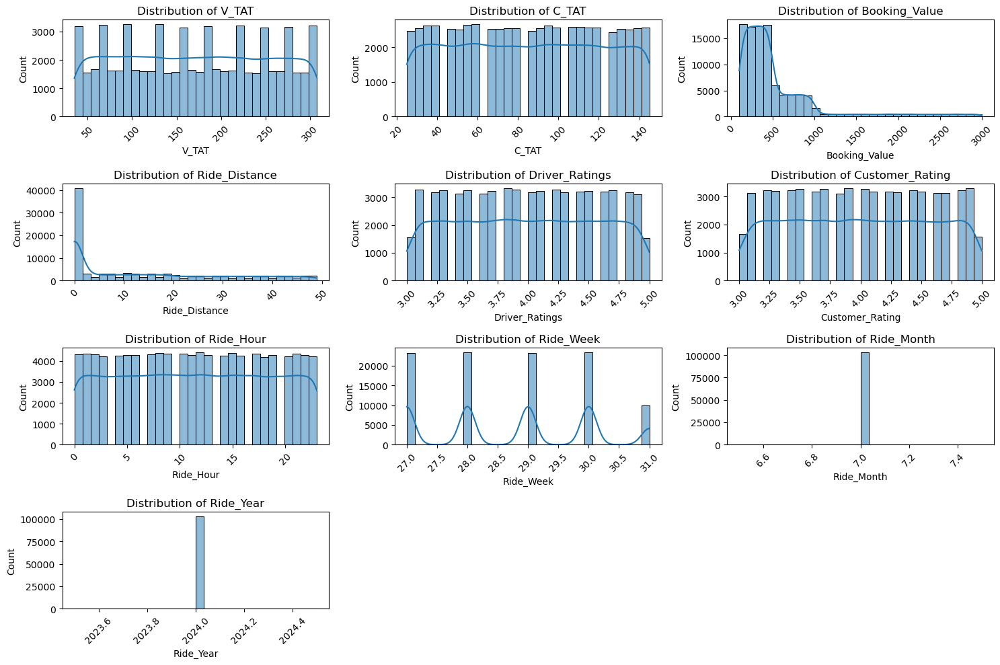

In [27]:
# Iterate through each channel and plot on a separate subplot
numeric_cols = data.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(15, 10))
for i, column in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//3 + 1, 3, i+1)
    sns.histplot(df[column], kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

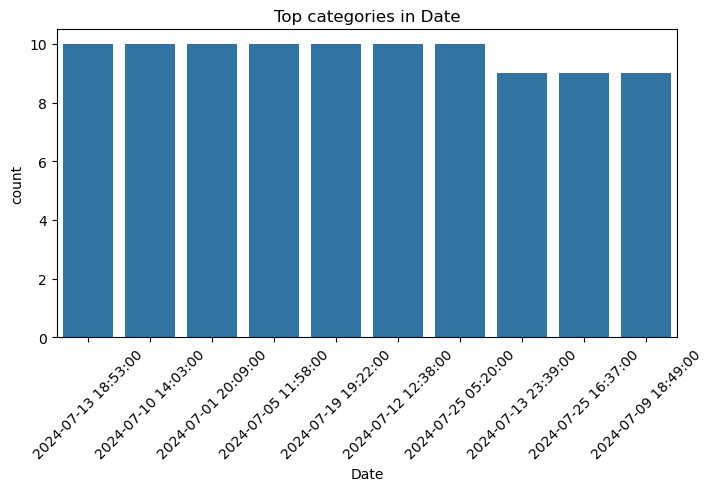

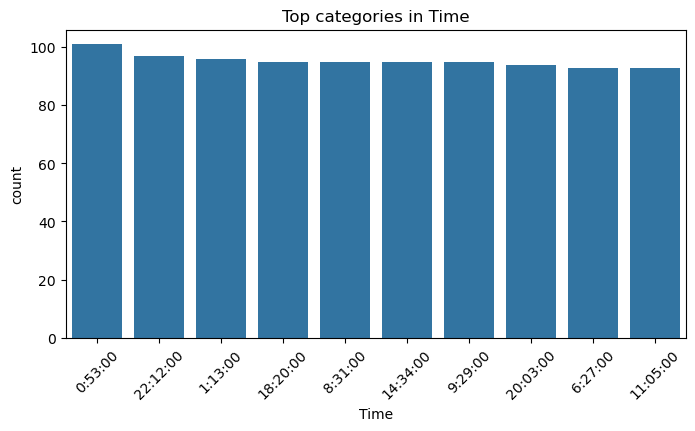

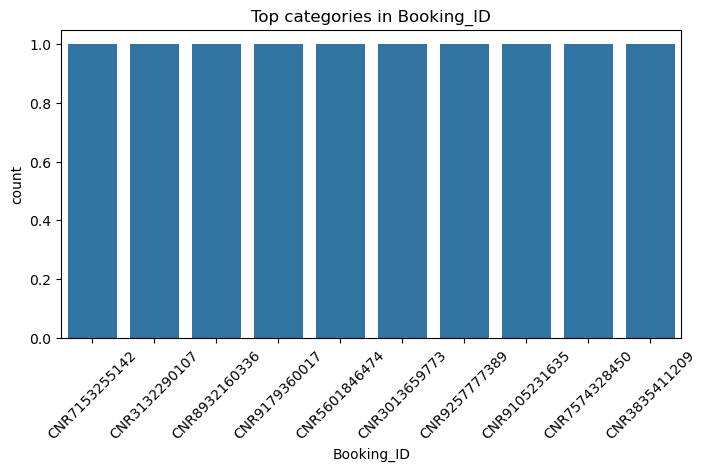

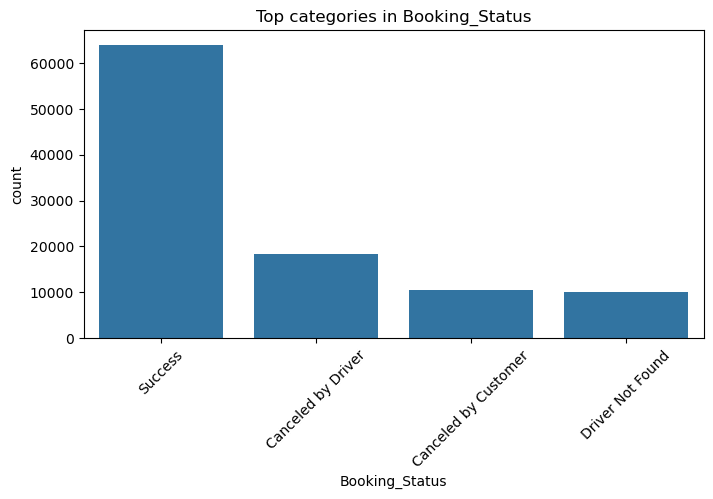

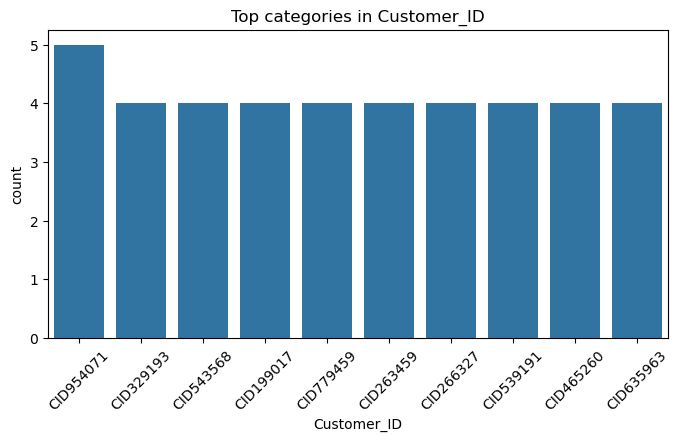

...

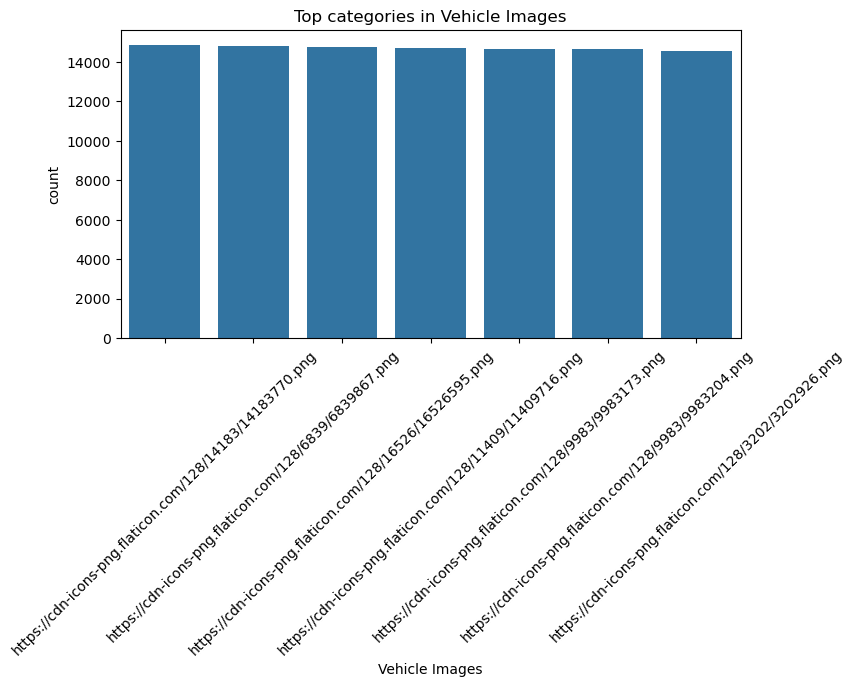

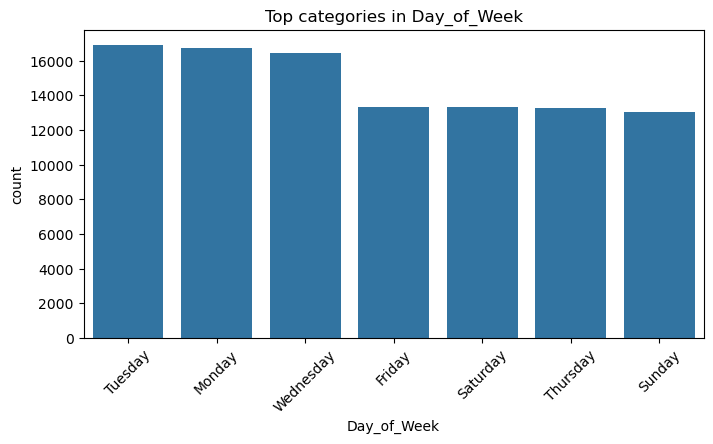

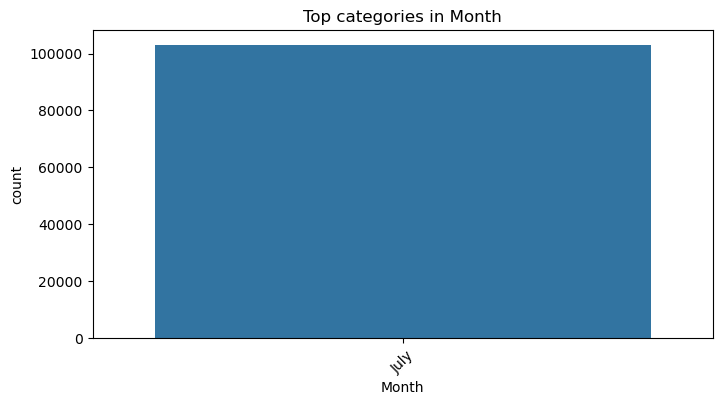

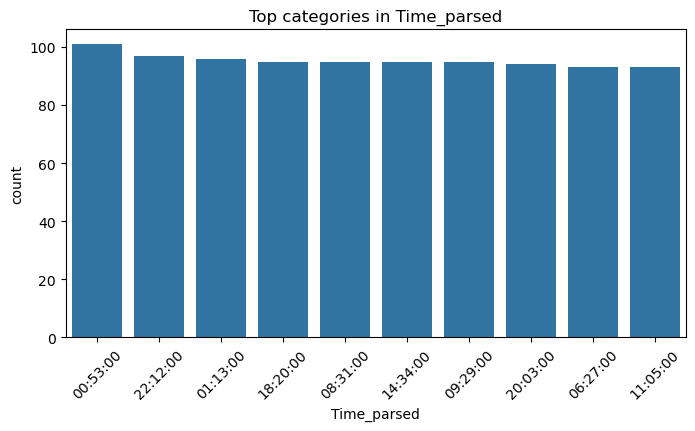

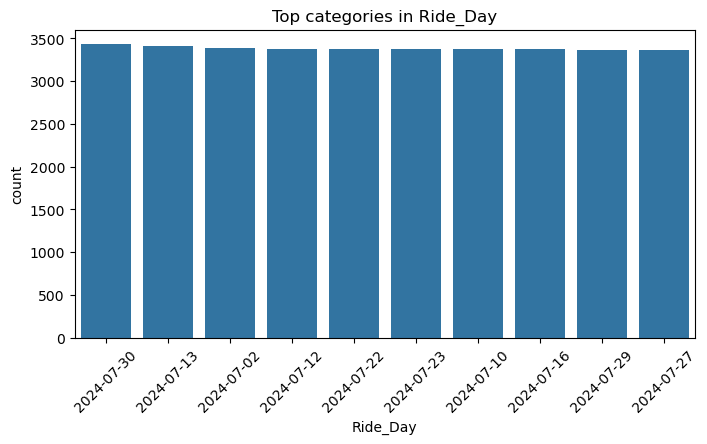

In [28]:
cat_cols = data.select_dtypes(include=['object', 'category']).columns

for col in cat_cols:
    plt.figure(figsize=(8,4))
    sns.countplot(data=df, x=col, order=df[col].value_counts().index[:10])
    plt.title(f"Top categories in {col}")
    plt.xticks(rotation=45)
    plt.show()

## Normalize Distribution

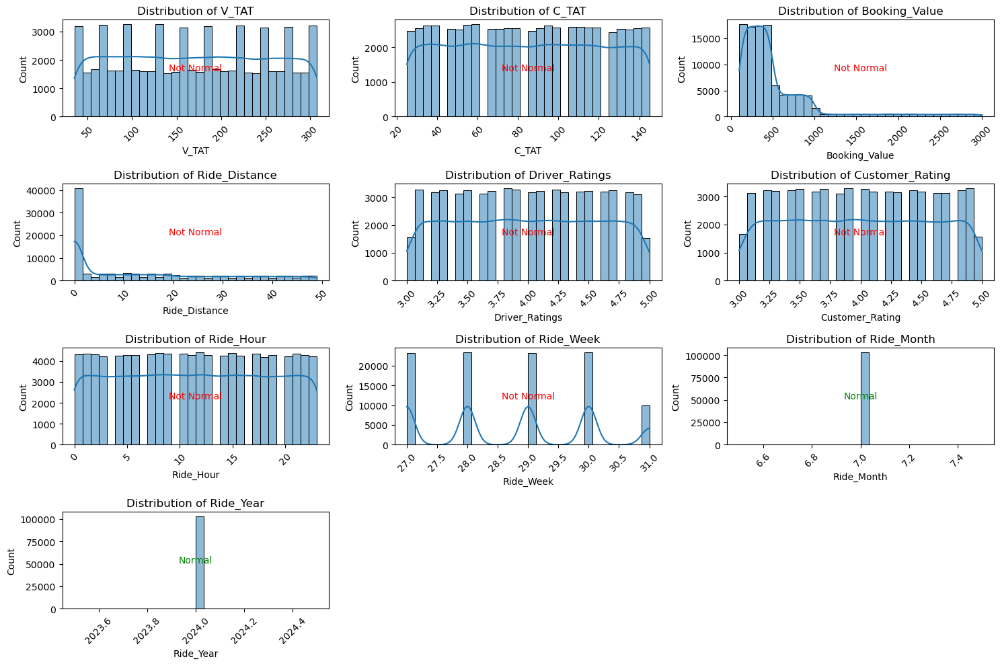

In [29]:
# Select only numeric columns
numeric_cols = data.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(15, 10))

# Iterate through numeric columns
for i, column in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//3 + 1, 3, i+1)

    # Drop NaNs for analysis
    col_data = data[column].dropna()

    # Plot distribution
    sns.histplot(col_data, kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Normality test (requires >= 8 values)
    if len(col_data) >= 8:
        k2, p = stats.normaltest(col_data)
        if p < 0.05:
            plt.text(0.5, 0.5, "Not Normal", 
                     horizontalalignment='center', 
                     verticalalignment='center', 
                     transform=plt.gca().transAxes, 
                     color="red")
        else:
            plt.text(0.5, 0.5, "Normal", 
                     horizontalalignment='center', 
                     verticalalignment='center', 
                     transform=plt.gca().transAxes, 
                     color="green")

plt.tight_layout()
plt.show()

## Skewed Distribution (negative and positive)

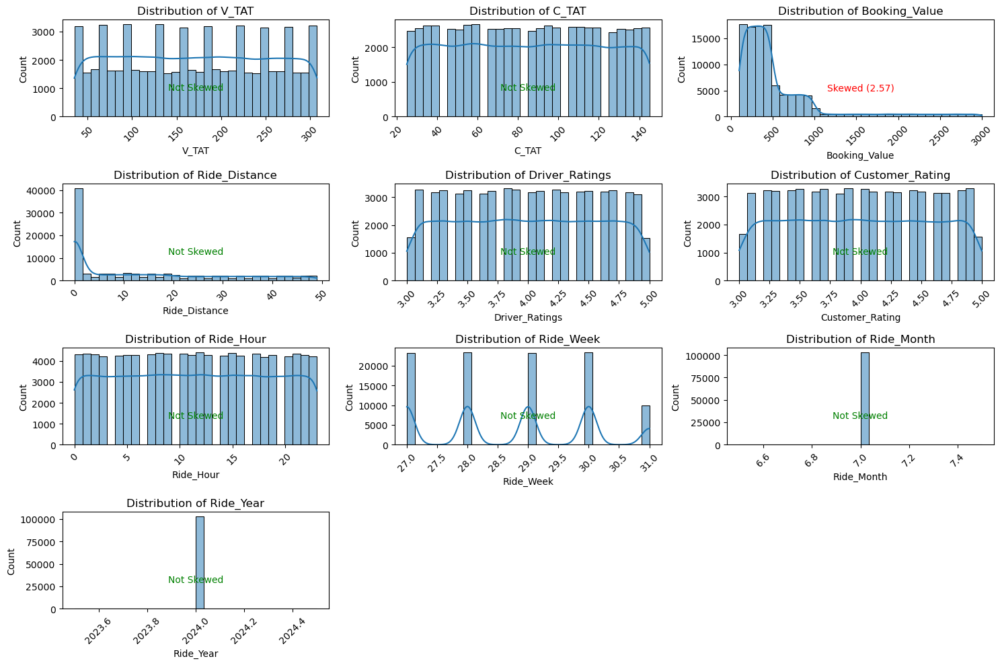

In [12]:
# Select only numeric columns
numeric_cols = df.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(15, 10))

# Iterate through numeric columns
for i, column in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//3 + 1, 3, i+1)

    # Drop NaNs for analysis
    col_data = df[column].dropna()

    # Plot distribution
    sns.histplot(col_data, kde=True, bins=30)
    plt.title(f'Distribution of {column}')
    plt.xticks(rotation=45)

    # Check for skewness (only if enough values)
    if len(col_data) > 1:
        skewness = stats.skew(col_data)
        if skewness < -1 or skewness > 1:
            plt.text(0.5, 0.3, f"Skewed ({skewness:.2f})", 
                     horizontalalignment='center', 
                     verticalalignment='center', 
                     transform=plt.gca().transAxes, 
                     color="red")
        else:
            plt.text(0.5, 0.3, "Not Skewed", 
                     horizontalalignment='center', 
                     verticalalignment='center', 
                     transform=plt.gca().transAxes, 
                     color="green")

plt.tight_layout()
plt.show()

## Detect Outliers

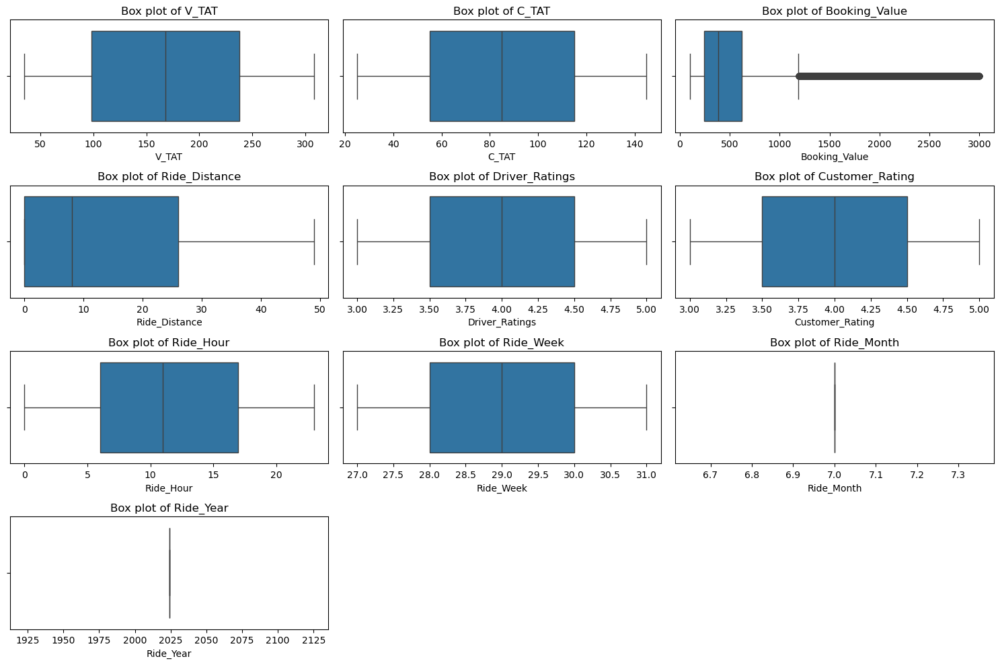

In [30]:
# Select only numeric columns
numeric_cols = data.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(15, 10))

# Iterate through numeric columns
for i, column in enumerate(numeric_cols):
    plt.subplot(len(numeric_cols)//3 + 1, 3, i+1)

    # Drop NaNs for analysis
    col_data = data[column].dropna()

    # Boxplot
    sns.boxplot(x=col_data)
    plt.title(f'Box plot of {column}')

plt.tight_layout()
plt.show()

In [31]:
# Select numeric columns
numeric_cols = data.select_dtypes(include=[np.number]).columns

outlier_summary = {}

for column in numeric_cols:
    col_data = data[column].dropna()
    
    # Compute IQR
    Q1 = col_data.quantile(0.25)
    Q3 = col_data.quantile(0.75)
    IQR = Q3 - Q1
    
    # Define outlier boundaries
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Count outliers
    outliers = ((col_data < lower_bound) | (col_data > upper_bound)).sum()
    outlier_percentage = (outliers / len(col_data)) * 100
    
    outlier_summary[column] = {
        "Total Values": len(col_data),
        "Outliers": outliers,
        "Outlier %": round(outlier_percentage, 2),
        "Lower Bound": round(lower_bound, 2),
        "Upper Bound": round(upper_bound, 2)
    }

# Convert to DataFrame for better view
outlier_df = pd.DataFrame(outlier_summary).T
print(outlier_df)

                 Total Values  Outliers  Outlier %  Lower Bound  Upper Bound
V_TAT                 63967.0       0.0       0.00       -112.0        448.0
C_TAT                 63967.0       0.0       0.00        -35.0        205.0
Booking_Value        103024.0    8468.0       8.22       -326.5       1189.5
Ride_Distance        103024.0       0.0       0.00        -39.0         65.0
Driver_Ratings        63967.0       0.0       0.00          2.0          6.0
Customer_Rating       63967.0       0.0       0.00          2.0          6.0
Ride_Hour            103024.0       0.0       0.00        -10.5         33.5
Ride_Week            103024.0       0.0       0.00         25.0         33.0
Ride_Month           103024.0       0.0       0.00          7.0          7.0
Ride_Year            103024.0       0.0       0.00       2024.0       2024.0


In [32]:
# Function to detect outliers using Z-score
def detect_outliers_z_score(data, threshold=3):
    # Select only numeric columns
    numeric_df = data.select_dtypes(include=[np.number])
    
    # Compute Z-scores
    z_scores = (numeric_df - numeric_df.mean()) / numeric_df.std()
    
    # Flag rows where any column has |z| > threshold
    outliers = (np.abs(z_scores) > threshold).any(axis=1)
    return outliers

# Detect outliers
outliers = detect_outliers_z_score(df, threshold=3)

# Get indices of outlier rows
outlier_indices = df.index[outliers].tolist()

print("Index of rows with outliers:", outlier_indices[:20], "...")  # show first 20
print("Count of outliers:", len(outlier_indices))

Index of rows with outliers: [28, 49, 78, 81, 97, 107, 109, 127, 135, 139, 219, 251, 296, 316, 393, 395, 398, 415, 450, 468] ...
Count of outliers: 3915


## Remove Outliers

In [34]:
# Drop rows where any numeric column has outliers
data_no_outliers = data.drop(index=outlier_indices).reset_index(drop=True)

print("Original shape:", data.shape)
print("After removing outliers:", data_no_outliers.shape)

Original shape: (103024, 28)
After removing outliers: (99109, 28)


## Export newly cleaned

In [35]:
# Export your cleaned dataframe
data_no_outliers.to_csv("rides_no_outliers.csv", index=False)
print("CSV exported successfully!")

CSV exported successfully!


## Now Load Cleaned file into variable

In [100]:
df = pd.read_csv("rides_no_outliers.csv")

In [101]:
df.head(5)
df.shape

(99109, 28)

#### Key Business Metrics (Basic EDA)

In [38]:
# Total Rides & Successful Rides
total_rides = len(df)
successful_rides = (df["Booking_Status"]=="Success").sum()

print(f"Total Rides: {total_rides}")
print(f"Successful Rides: {successful_rides}")
print(f"Success Rate: {successful_rides/total_rides:.2%}")

Total Rides: 99109
Successful Rides: 61515
Success Rate: 62.07%


In [39]:
# Cancellation Breakdown
df["Booking_Status"].value_counts(normalize=True)*100

Booking_Status
Success                 62.068026
Canceled by Driver      17.883341
Canceled by Customer    10.187773
Driver Not Found         9.860860
Name: proportion, dtype: float64

In [40]:
total_rides = len(df)
success_rides = (df["Booking_Status"] == "Success").sum()
cancel_rides = (df["Booking_Status"].str.contains("Canceled")).sum()

print("Total Rides:", total_rides)
print("Successful Rides:", success_rides)
print("Cancelled Rides:", cancel_rides)
print("Success Rate: {:.2f}%".format(success_rides / total_rides * 100))
print("Cancelled Rate: {:.2F}%".format(cancel_rides / total_rides * 100))

Total Rides: 99109
Successful Rides: 61515
Cancelled Rides: 27821
Success Rate: 62.07%
Cancelled Rate: 28.07%


In [41]:
status_counts = df["Booking_Status"].value_counts(normalize=True) * 100
print(status_counts)

Booking_Status
Success                 62.068026
Canceled by Driver      17.883341
Canceled by Customer    10.187773
Driver Not Found         9.860860
Name: proportion, dtype: float64


In [42]:
# Revenue Overview
total_revenue = df["Booking_Value"].sum()
avg_revenue = df["Booking_Value"].mean()

print(f"Total Revenue: ₹{total_revenue:,.0f}")
print(f"Average Ride Revenue: ₹{avg_revenue:.2f}")

Total Revenue: ₹46,424,083
Average Ride Revenue: ₹468.41


#### Time-Based Analysis

In [43]:
# Convert Date column to datetime
df["Date"] = pd.to_datetime(df["Date"], errors="coerce")

# Create new features
df["Ride_Hour"] = df["Date"].dt.hour
df["Day_of_Week"] = df["Date"].dt.day_name()
df["Month"] = df["Date"].dt.month_name()

In [44]:
# 1) Quick sanity checks
print("Columns:", df.columns.tolist())
print("Ride_Hour in columns?", "Ride_Hour" in df.columns)
print("Date dtype:", df['Date'].dtype)
print("Sample Date/Time values:\n", df[['Date','Time']].head())

Columns: ['Date', 'Time', 'Booking_ID', 'Booking_Status', 'Customer_ID', 'Vehicle_Type', 'Pickup_Location', 'Drop_Location', 'V_TAT', 'C_TAT', 'Canceled_Rides_by_Customer', 'Canceled_Rides_by_Driver', 'Incomplete_Rides', 'Incomplete_Rides_Reason', 'Booking_Value', 'Payment_Method', 'Ride_Distance', 'Driver_Ratings', 'Customer_Rating', 'Vehicle Images', 'Ride_Hour', 'Day_of_Week', 'Month', 'Time_parsed', 'Ride_Day', 'Ride_Week', 'Ride_Month', 'Ride_Year']
Ride_Hour in columns? True
Date dtype: datetime64[ns]
Sample Date/Time values:
                  Date      Time
0 2024-07-26 14:00:00  14:00:00
1 2024-07-25 22:20:00  22:20:00
2 2024-07-30 19:59:00  19:59:00
3 2024-07-22 03:15:00   3:15:00
4 2024-07-02 09:02:00   9:02:00


In [45]:
# 2) Remove accidental whitespace in column names (common issue)
df.columns = df.columns.str.strip()

In [46]:
# 3) Ensure Date is datetime (safe conversion)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# If Time is a separate column (like '14:00:00'), convert that too
# Some rows may have NaN after conversion — that's fine, we'll handle it.
df['Time_parsed'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.time

print(df['Date'].dtype, df['Time_parsed'].dtype)

datetime64[ns] object


In [47]:
# 4) Create Ride_Hour robustly:
# Use the Time column when available, otherwise fall back to Date's hour.
# This handles both dataframe flavors.
df['Ride_Hour'] = pd.to_datetime(df['Time'], format='%H:%M:%S', errors='coerce').dt.hour
# fallback where Time parsing failed
missing_hour_mask = df['Ride_Hour'].isna()
df.loc[missing_hour_mask, 'Ride_Hour'] = df.loc[missing_hour_mask, 'Date'].dt.hour

# If still NaN, those rows will be dropped for hour-based plots.
print("Ride_Hour created. Nulls:", df['Ride_Hour'].isna().sum())
print(df['Ride_Hour'].head(10))

Ride_Hour created. Nulls: 0
0    14
1    22
2    19
3     3
4     9
5     4
6     9
7    11
8    19
9     1
Name: Ride_Hour, dtype: int32


In [48]:
# 5) Convert to integer (optional but cleaner for plotting) and drop rows without an hour
df = df.copy()  # safe copy
df = df.dropna(subset=['Ride_Hour'])
df['Ride_Hour'] = df['Ride_Hour'].astype(int)

#### Visuals

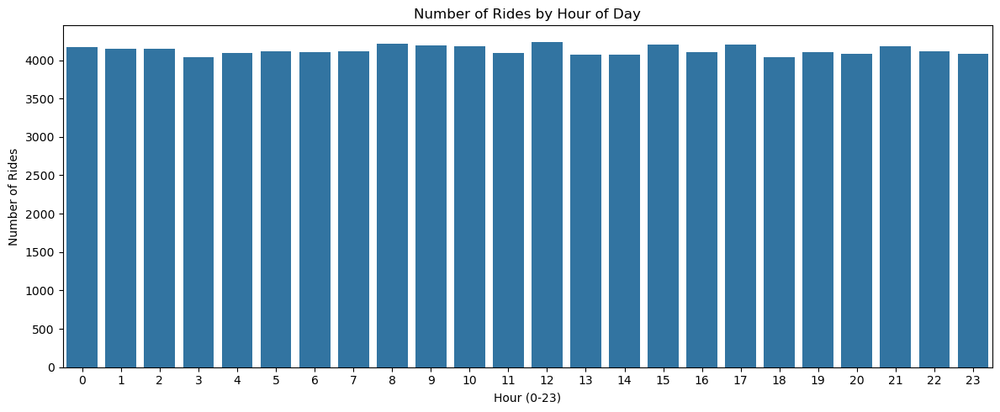

In [49]:
# Plot Number of Rides by Hour of Day (Seaborn)
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12,5))
sns.countplot(x='Ride_Hour', data=df, order=sorted(df['Ride_Hour'].unique()))
plt.title("Number of Rides by Hour of Day")
plt.xlabel("Hour (0-23)")
plt.ylabel("Number of Rides")
plt.tight_layout()
plt.show()

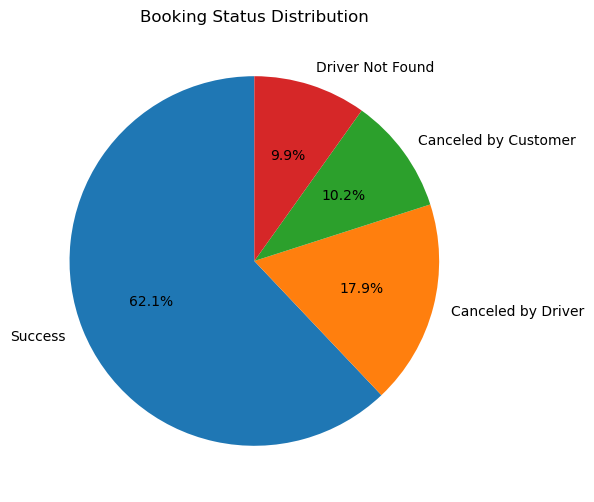

In [50]:
# Booking Status Distribution
plt.figure(figsize=(6,6))
df["Booking_Status"].value_counts().plot(kind="pie", autopct="%1.1f%%", startangle=90)
plt.title("Booking Status Distribution")
plt.ylabel("")
plt.show()

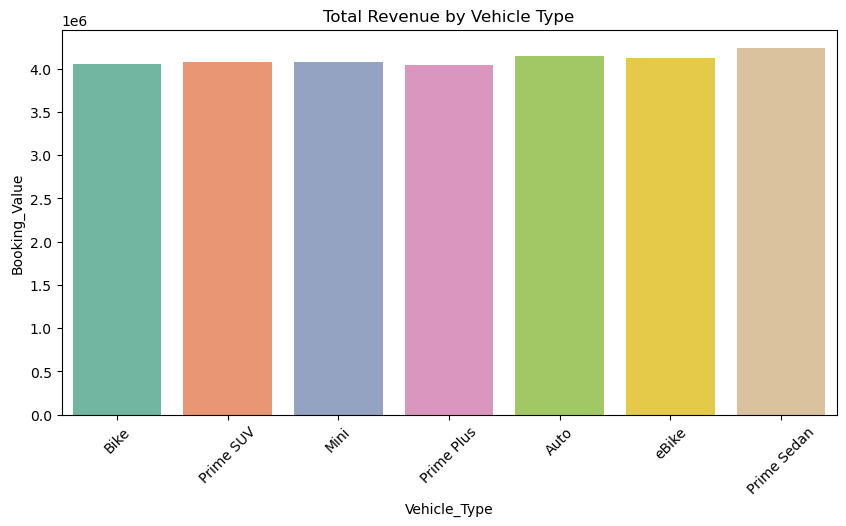

In [51]:
# Revenue by Vehicle Type
plt.figure(figsize=(10,5))
sns.barplot(x="Vehicle_Type", y="Booking_Value", data=df[df["Booking_Status"]=="Success"],
            estimator=sum, ci=None, palette="Set2")
plt.title("Total Revenue by Vehicle Type")
plt.xticks(rotation=45)
plt.show()

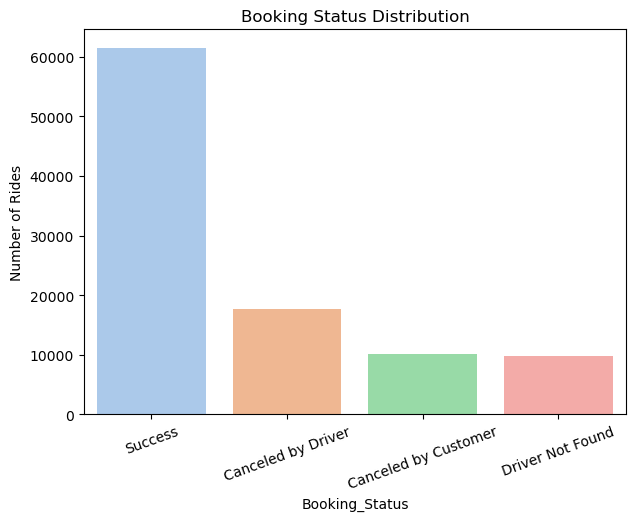

In [52]:
# Booking Status Analysis
plt.figure(figsize=(7,5))
sns.countplot(x="Booking_Status", data=df, order=df["Booking_Status"].value_counts().index, palette="pastel")
plt.title("Booking Status Distribution")
plt.ylabel("Number of Rides")
plt.xticks(rotation=20)
plt.show()

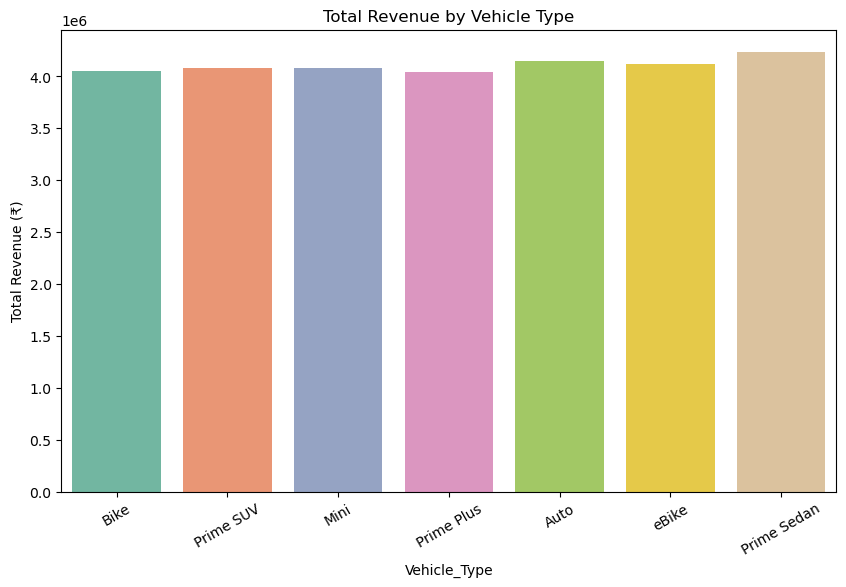

In [53]:
# Revenue by Vehicle Type
#Which vehicle generates the most revenue?
plt.figure(figsize=(10,6))
sns.barplot(
    x="Vehicle_Type", 
    y="Booking_Value", 
    data=df[df["Booking_Status"]=="Success"],
    estimator=sum, 
    ci=None, 
    palette="Set2"
)
plt.title("Total Revenue by Vehicle Type")
plt.ylabel("Total Revenue (₹)")
plt.xticks(rotation=30)
plt.show()

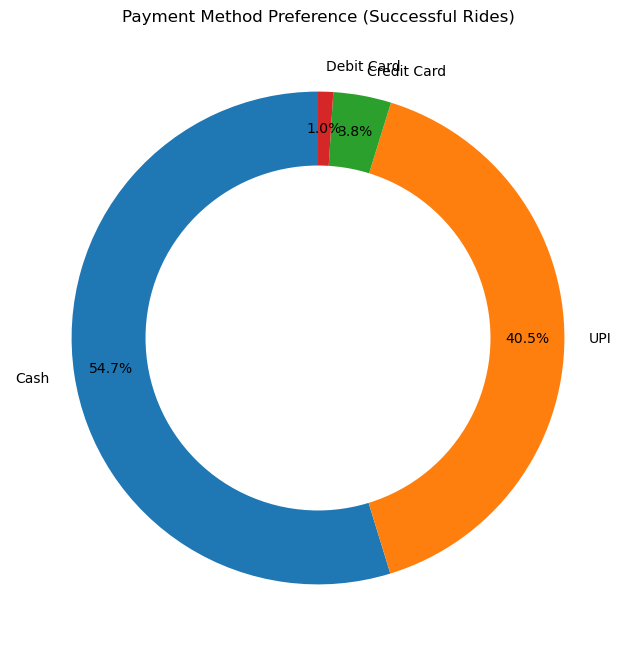

In [54]:
# Payment Method Preference
# Among successful rides, let’s check how people pay.
# Count only successful rides (payment is relevant there)
# Fill NaN with "Not Applicable"
df["Payment_Method"] = df["Payment_Method"].fillna("Not Applicable")

# Count again only successful rides
payment_counts = df[df["Booking_Status"]=="Success"]["Payment_Method"].value_counts()

# Plot donut with better spacing
plt.figure(figsize=(8,8))
wedges, texts, autotexts = plt.pie(
    payment_counts,
    labels=payment_counts.index,
    autopct="%1.1f%%",
    startangle=90,
    pctdistance=0.85,       # move % labels closer to center
    wedgeprops=dict(width=0.4)  # donut effect
)

# Draw white circle in center
centre_circle = plt.Circle((0,0),0.70,fc='white')
fig = plt.gcf()
fig.gca().add_artist(centre_circle)

plt.title("Payment Method Preference (Successful Rides)")
plt.show()

In [55]:
# Ensure ratings are numeric
df["Customer_Rating"] = pd.to_numeric(df["Customer_Rating"], errors="coerce")

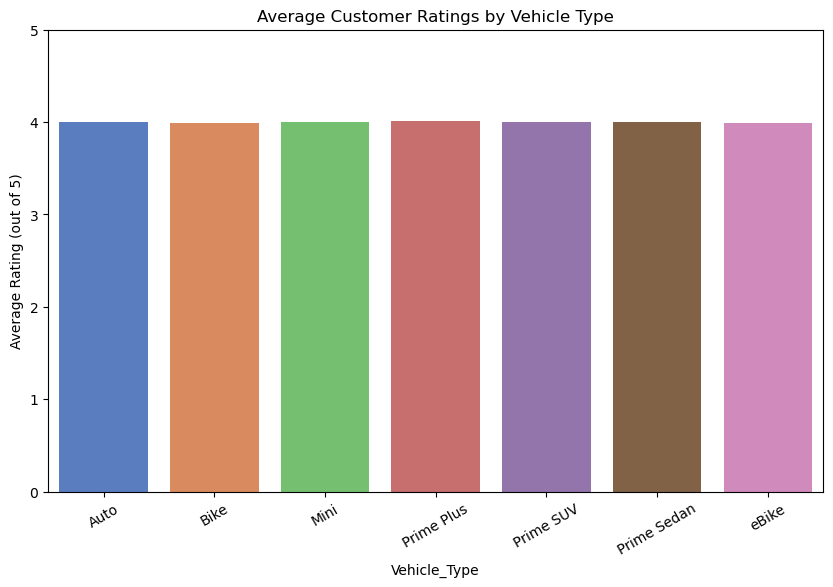

In [56]:
# Average Customer Ratings by Vehicle Type Bar plot with mean ratings
ratings_by_vehicle = (
    df[df["Booking_Status"]=="Success"]
    .groupby("Vehicle_Type")["Customer_Rating"]
    .mean()
    .reset_index()
)

plt.figure(figsize=(10,6))
sns.barplot(
    x="Vehicle_Type",
    y="Customer_Rating",
    data=ratings_by_vehicle,
    palette="muted"
)
plt.title("Average Customer Ratings by Vehicle Type")
plt.ylabel("Average Rating (out of 5)")
plt.xticks(rotation=30)
plt.ylim(0,5)  # force scale for clarity
plt.show()

In [57]:
# Check the actual averages
df_success = df[(df["Booking_Status"]=="Success") & (df["Customer_Rating"].notna())]

print(
    df_success.groupby("Vehicle_Type")["Customer_Rating"]
    .agg(["count","mean","std"])
)

              count      mean       std
Vehicle_Type                           
Auto           8817  3.999807  0.578383
Bike           8777  3.993802  0.577079
Mini           8723  3.995632  0.578480
Prime Plus     8695  4.008097  0.582399
Prime SUV      8687  3.998860  0.584184
Prime Sedan    8998  4.001989  0.575887
eBike          8818  3.986754  0.578482


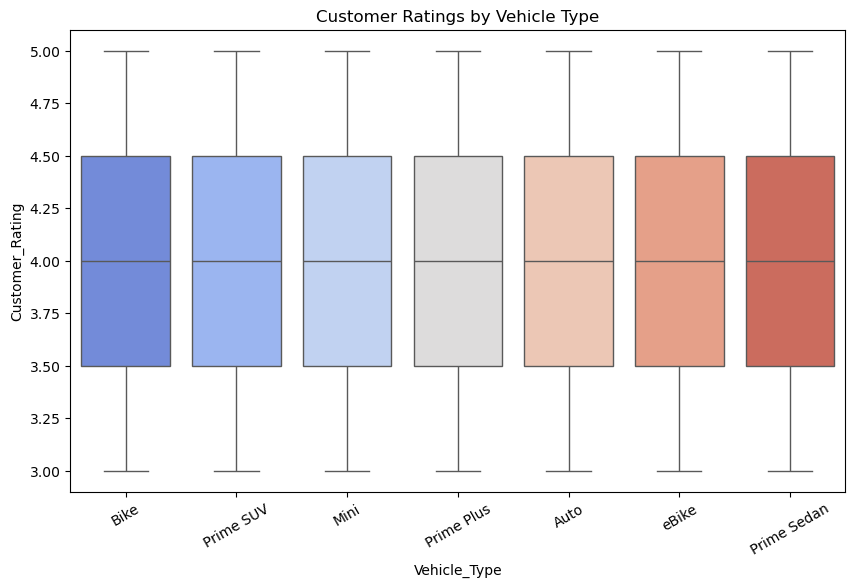

In [58]:
# Customer Ratings by Vehicle Type
plt.figure(figsize=(10,6))
sns.boxplot(x="Vehicle_Type", y="Customer_Rating", 
            data=df[df["Booking_Status"]=="Success"], palette="coolwarm")
plt.title("Customer Ratings by Vehicle Type")
plt.xticks(rotation=30)
plt.show()

       Ride_Distance  Booking_Value
count   99109.000000   99109.000000
mean       14.188893     468.414402
std        15.773528     356.445126
min         0.000000     100.000000
25%         0.000000     237.000000
50%         8.000000     375.000000
75%        27.000000     553.000000
max        49.000000    2158.000000


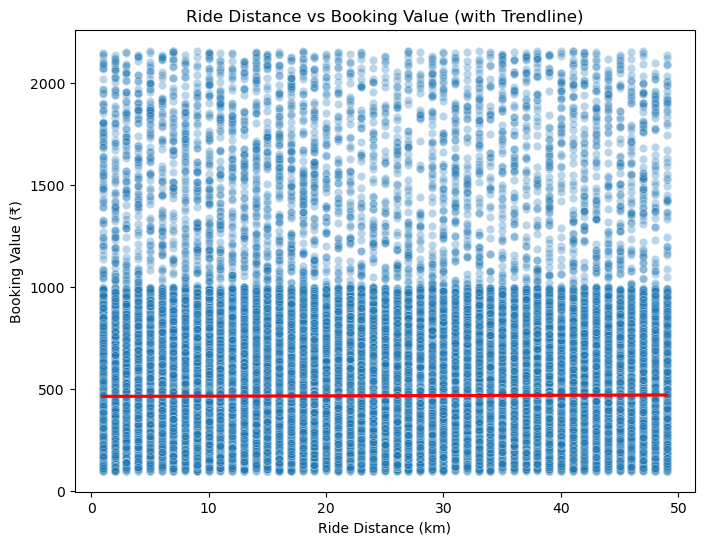

In [59]:
# Distance vs Fare
# Do longer trips always mean higher booking value?
# Ensure booking value and distance are numeric
# Ensure booking value and distance are numeric
df["Booking_Value"] = pd.to_numeric(df["Booking_Value"], errors="coerce")
df["Ride_Distance"] = pd.to_numeric(df["Ride_Distance"], errors="coerce")

print(df[["Ride_Distance","Booking_Value"]].describe())  # check spread

# Scatter + regression line
plt.figure(figsize=(8,6))
sns.scatterplot(
    x="Ride_Distance", 
    y="Booking_Value", 
    data=df[df["Booking_Status"]=="Success"], 
    alpha=0.3
)
sns.regplot(
    x="Ride_Distance", 
    y="Booking_Value", 
    data=df[df["Booking_Status"]=="Success"], 
    scatter=False, 
    color="red"
)
plt.title("Ride Distance vs Booking Value (with Trendline)")
plt.xlabel("Ride Distance (km)")
plt.ylabel("Booking Value (₹)")
plt.show()

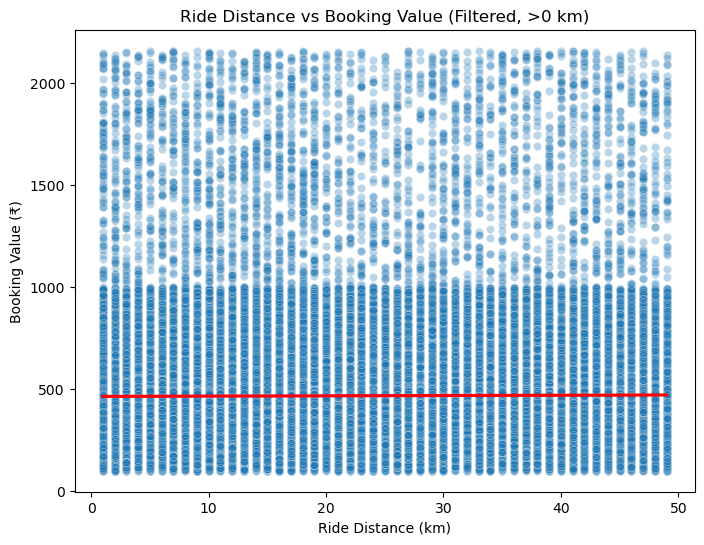

In [60]:
valid_rides = df[(df["Booking_Status"]=="Success") & (df["Ride_Distance"] > 0)]

plt.figure(figsize=(8,6))
sns.scatterplot(
    x="Ride_Distance", 
    y="Booking_Value", 
    data=valid_rides, 
    alpha=0.3
)
sns.regplot(
    x="Ride_Distance", 
    y="Booking_Value", 
    data=valid_rides, 
    scatter=False, 
    color="red"
)
plt.title("Ride Distance vs Booking Value (Filtered, >0 km)")
plt.xlabel("Ride Distance (km)")
plt.ylabel("Booking Value (₹)")
plt.show()

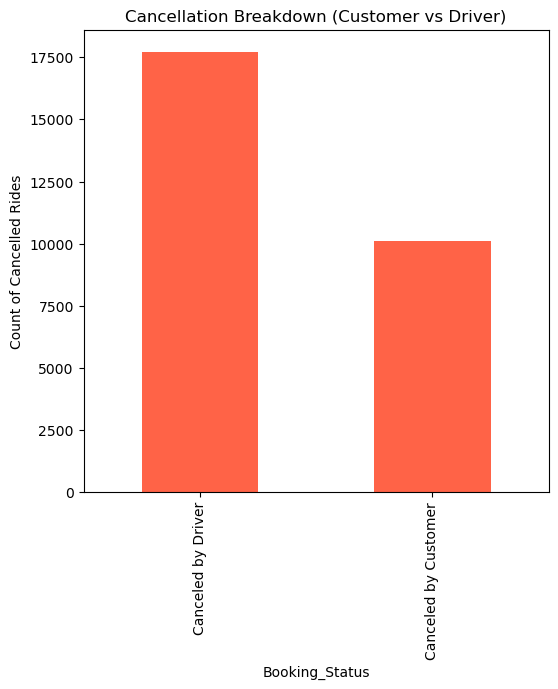

In [61]:
# Cancellation Breakdown (Customer vs Driver vs Others)
cancel_counts = df[df["Booking_Status"].str.contains("Canceled")]["Booking_Status"].value_counts()

plt.figure(figsize=(6,6))
cancel_counts.plot(kind="bar", color="tomato")
plt.title("Cancellation Breakdown (Customer vs Driver)")
plt.ylabel("Count of Cancelled Rides")
plt.show()

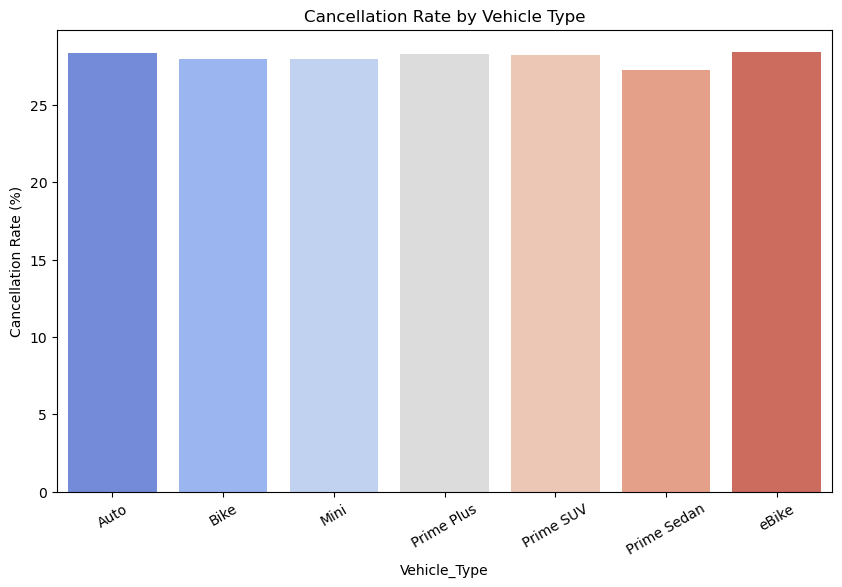

In [62]:
# Cancellation Rate by Vehicle Type
cancellation_summary = (
    df.groupby("Vehicle_Type")["Booking_Status"]
    .apply(lambda x: (x.str.contains("Canceled").sum() / len(x))*100)
    .reset_index(name="Cancellation Rate (%)")
)

plt.figure(figsize=(10,6))
sns.barplot(
    x="Vehicle_Type", 
    y="Cancellation Rate (%)", 
    data=cancellation_summary, 
    palette="coolwarm"
)
plt.title("Cancellation Rate by Vehicle Type")
plt.ylabel("Cancellation Rate (%)")
plt.xticks(rotation=30)
plt.show()

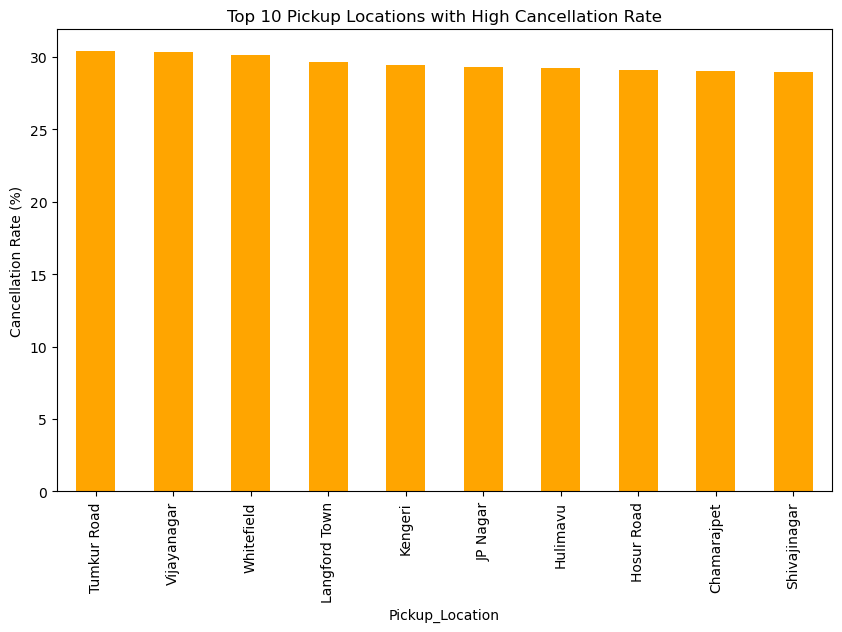

In [63]:
# Top Pickup Locations with High Cancellation Rate
pickup_cancel = (
    df.groupby("Pickup_Location")["Booking_Status"]
    .apply(lambda x: (x.str.contains("Canceled").sum() / len(x))*100)
    .sort_values(ascending=False)
    .head(10)
)

plt.figure(figsize=(10,6))
pickup_cancel.plot(kind="bar", color="orange")
plt.title("Top 10 Pickup Locations with High Cancellation Rate")
plt.ylabel("Cancellation Rate (%)")
plt.show()

## KPI Summary

In [64]:
# Filter successful rides
success_rides = df[df["Booking_Status"]=="Success"]

# Calculate KPIs
total_rides = len(df)
success_rate = round((len(success_rides) / total_rides) * 100, 2)
cancellation_rate = round((df["Booking_Status"].str.contains("Canceled").sum() / total_rides) * 100, 2)

avg_fare = round(success_rides["Booking_Value"].mean(), 2)
avg_distance = round(success_rides["Ride_Distance"].mean(), 2)
avg_rating = round(success_rides["Customer_Rating"].mean(), 2)

kpi_summary = {
    "Total Rides": total_rides,
    "Success Rate (%)": success_rate,
    "Cancellation Rate (%)": cancellation_rate,
    "Avg Fare (₹)": avg_fare,
    "Avg Distance (km)": avg_distance,
    "Avg Customer Rating": avg_rating
}

import pandas as pd
kpi_df = pd.DataFrame([kpi_summary])
display(kpi_df)

,Total Rides,Success Rate (%),Cancellation Rate (%),Avg Fare (₹),Avg Distance (km),Avg Customer Rating
0,99109,62.07,28.07,467.37,22.86,4.0


# Time-Series Trends
1️⃣ Preprocess Date Column

In [65]:
# Ensure Date column is datetime
df["Date"] = pd.to_datetime(df["Date"], errors="coerce")

# Extract day, week, month
df["Ride_Day"] = df["Date"].dt.date
df["Ride_Week"] = df["Date"].dt.isocalendar().week
df["Ride_Month"] = df["Date"].dt.month
df["Ride_Year"] = df["Date"].dt.year

2️⃣ Daily Ride Trends (Success vs Cancellations)

<Figure size 1400x600 with 0 Axes>

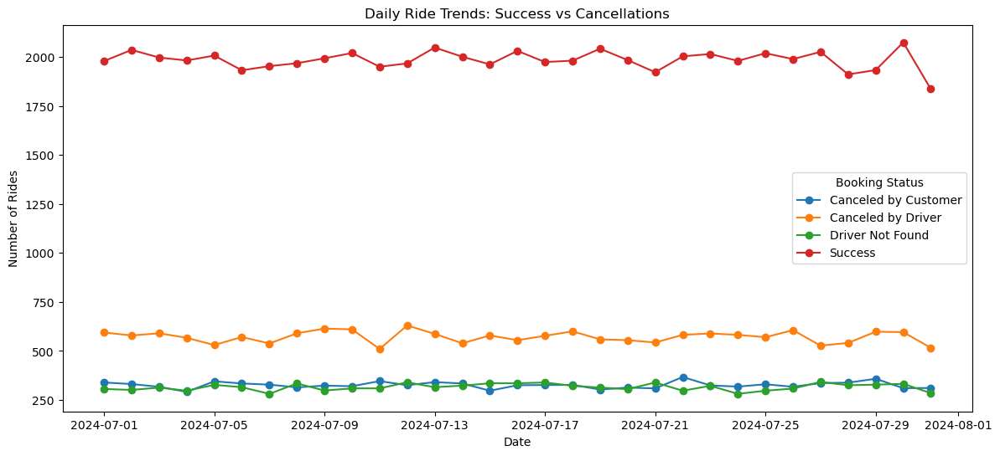

In [66]:
daily_trends = df.groupby(["Ride_Day", "Booking_Status"]).size().unstack(fill_value=0)

plt.figure(figsize=(14,6))
daily_trends.plot(kind="line", marker="o", figsize=(14,6))
plt.title("Daily Ride Trends: Success vs Cancellations")
plt.xlabel("Date")
plt.ylabel("Number of Rides")
plt.legend(title="Booking Status")
plt.show()

3️⃣ Weekly Revenue Trends

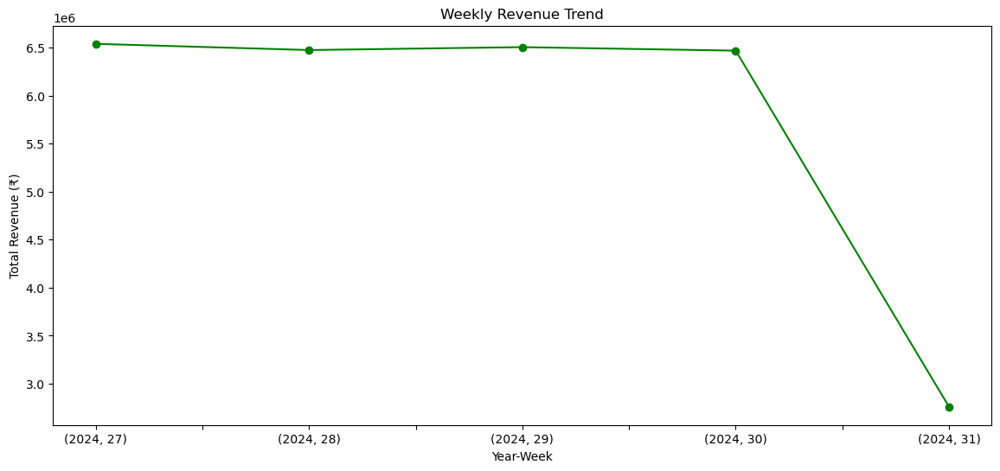

In [67]:
weekly_revenue = (
    df[df["Booking_Status"]=="Success"]
    .groupby(["Ride_Year", "Ride_Week"])["Booking_Value"]
    .sum()
)

weekly_revenue.plot(kind="line", figsize=(14,6), marker="o", color="green")
plt.title("Weekly Revenue Trend")
plt.xlabel("Year-Week")
plt.ylabel("Total Revenue (₹)")
plt.show()

4️⃣ Monthly Cancellation Rate

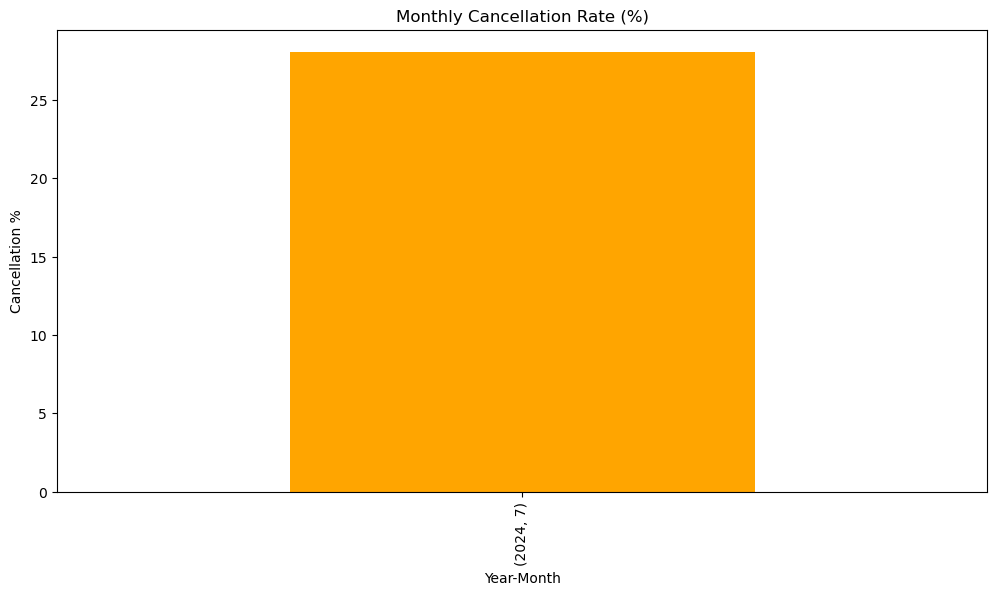

In [68]:
monthly_cancellations = (
    df.groupby(["Ride_Year", "Ride_Month"])["Booking_Status"]
    .apply(lambda x: (x.str.contains("Canceled").sum() / len(x)) * 100)
)

monthly_cancellations.plot(kind="bar", figsize=(12,6), color="orange")
plt.title("Monthly Cancellation Rate (%)")
plt.ylabel("Cancellation %")
plt.xlabel("Year-Month")
plt.show()

# Customer Segmentation Analysis

In [69]:
customer_rides = df.groupby("Customer_ID")["Booking_ID"].count().reset_index(name="Total_Rides")
print(customer_rides["Total_Rides"].describe())

count    91137.000000
mean         1.087473
std          0.301649
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          5.000000
Name: Total_Rides, dtype: float64


#### 1️⃣ Frequent Riders (Customer Loyalty)

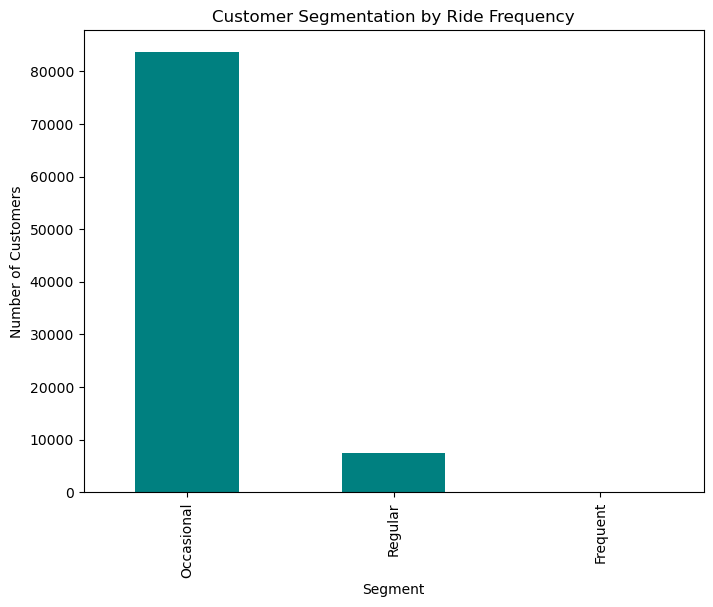

In [70]:
# Segmentation Rule (example based on percentiles) →
# Occasional: ≤ 2 rides (below median).
# Regular: 3–10 rides (between median and ~90th percentile).
# Frequent: > 10 rides (top 10% heavy users).
customer_rides["Segment"] = pd.cut(
    customer_rides["Total_Rides"],
    bins=[0, 1, 3, 5],   # valid increasing bins
    labels=["Occasional", "Regular", "Frequent"],
    include_lowest=True
)

plt.figure(figsize=(8,6))
customer_rides["Segment"].value_counts().plot(kind="bar", color="teal")
plt.title("Customer Segmentation by Ride Frequency")
plt.ylabel("Number of Customers")
plt.show()

#### High-Value Customers (Top Spenders)

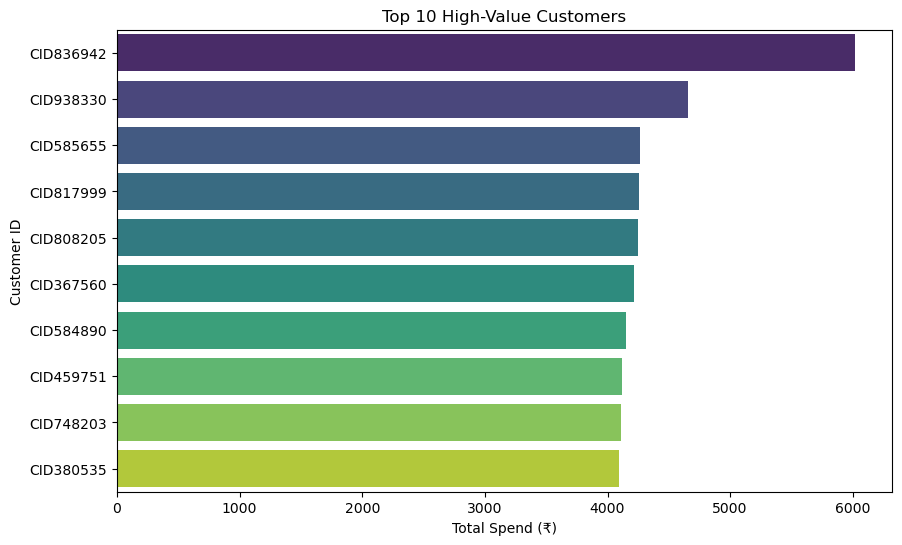

In [71]:
customer_value = df[df["Booking_Status"]=="Success"].groupby("Customer_ID")["Booking_Value"].sum().reset_index()

top_customers = customer_value.sort_values(by="Booking_Value", ascending=False).head(10)

plt.figure(figsize=(10,6))
sns.barplot(x="Booking_Value", y="Customer_ID", data=top_customers, palette="viridis")
plt.title("Top 10 High-Value Customers")
plt.xlabel("Total Spend (₹)")
plt.ylabel("Customer ID")
plt.show()

#### 3️⃣ Preferred Vehicle Type per Customer

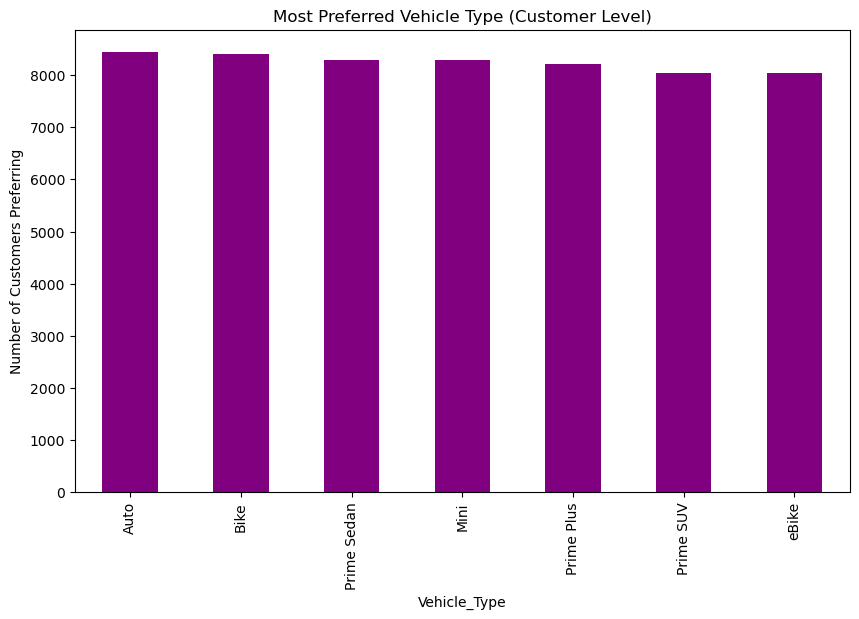

In [72]:
customer_vehicle_pref = (
    df[df["Booking_Status"]=="Success"]
    .groupby(["Customer_ID","Vehicle_Type"])["Booking_ID"]
    .count()
    .reset_index(name="Ride_Count")
)

# Find top vehicle per customer
preferred_vehicle = customer_vehicle_pref.loc[
    customer_vehicle_pref.groupby("Customer_ID")["Ride_Count"].idxmax()
]

plt.figure(figsize=(10,6))
preferred_vehicle["Vehicle_Type"].value_counts().plot(kind="bar", color="purple")
plt.title("Most Preferred Vehicle Type (Customer Level)")
plt.ylabel("Number of Customers Preferring")
plt.show()

### Anomaly & Fraud Detection
Why this step?

Ola needs to spot unusual rides that may indicate fraud or system errors.

Common red flags in ride data:

Zero-distance rides with high fare.

Very short rides with very high fare → surge abuse.

Extremely long rides with very low fare → system error.

Suspicious cancellation patterns (e.g., one customer cancels many rides).

#### 1️⃣ Zero Distance but Non-Zero Fare

In [73]:
anomaly_zero = df[(df["Ride_Distance"] == 0) & (df["Booking_Value"] > 0)]
print("Zero-distance paid rides:", len(anomaly_zero))

Zero-distance paid rides: 37594


#### 2️⃣ Very Short Distance but High Fare (Potential Surge)

In [74]:
short_high = df[(df["Ride_Distance"] < 2) & (df["Booking_Value"] > 500)]
print("Suspicious surge rides:", len(short_high))

Suspicious surge rides: 10685


#### 3️⃣ Long Rides with Very Low Fare

In [75]:
long_low = df[(df["Ride_Distance"] > 20) & (df["Booking_Value"] < 200)]
print("Long distance but low fare rides:", len(long_low))

Long distance but low fare rides: 5753


#### 4️⃣ Top 10 Customers by Cancellations

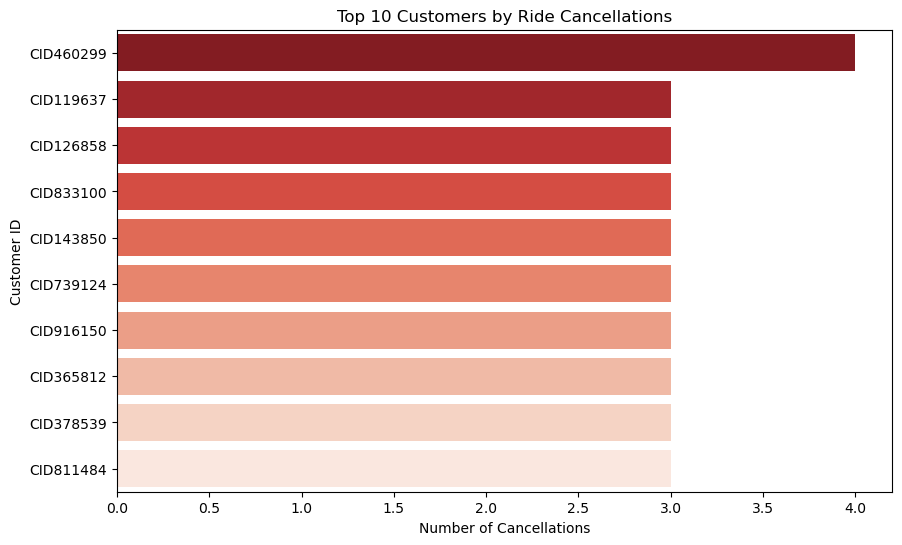

In [76]:
cancel_by_customer = (
    df[df["Booking_Status"].str.contains("Canceled")]
    .groupby("Customer_ID")["Booking_ID"]
    .count()
    .reset_index(name="Cancel_Count")
    .sort_values(by="Cancel_Count", ascending=False)
    .head(10)
)

plt.figure(figsize=(10,6))
sns.barplot(x="Cancel_Count", y="Customer_ID", data=cancel_by_customer, palette="Reds_r")
plt.title("Top 10 Customers by Ride Cancellations")
plt.xlabel("Number of Cancellations")
plt.ylabel("Customer ID")
plt.show()

## Driver-Side Anomaly & Performance Analysis

### Driver-Side Behavior Analysis without Driver_ID
1️⃣ How Many Rides Were Canceled by Drivers?

In [77]:
driver_cancel_count = df["Canceled_Rides_by_Driver"].notna().sum()
print("Total driver cancellations:", driver_cancel_count)

# % of cancellations caused by drivers
total_rides = len(df)
print("Percentage:", round(driver_cancel_count / total_rides * 100, 2), "%")

Total driver cancellations: 17724
Percentage: 17.88 %


2️⃣ Average Driver Ratings (overall performance)

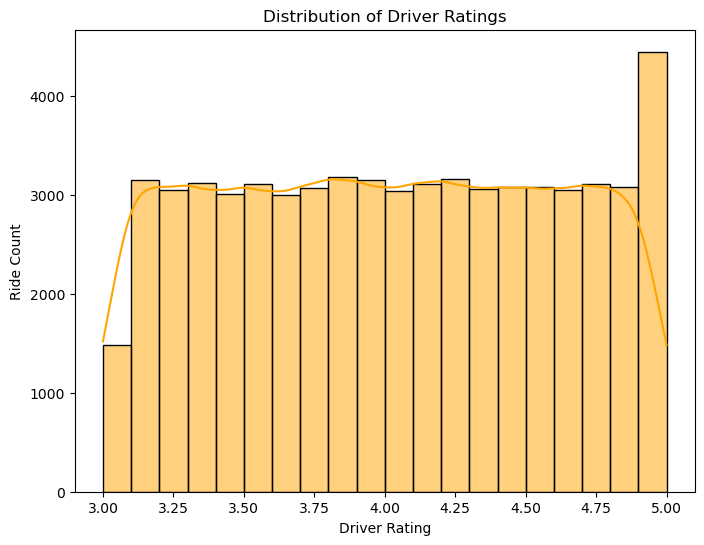

In [78]:
plt.figure(figsize=(8,6))
sns.histplot(df["Driver_Ratings"].dropna(), bins=20, kde=True, color="orange")
plt.title("Distribution of Driver Ratings")
plt.xlabel("Driver Rating")
plt.ylabel("Ride Count")
plt.show()

##### 3️⃣ Rides Where Driver Behavior Looked Suspicious

Cancelled by driver but with high booking value.

Driver rating very low (< 2.5).

In [79]:
suspicious_driver_rides = df[
    (df["Booking_Status"] == "Canceled by Driver") & (df["Booking_Value"] > 500)
]

low_rating_rides = df[df["Driver_Ratings"] < 2.5]

print("Suspicious cancellations:", len(suspicious_driver_rides))
print("Low-rated rides:", len(low_rating_rides))

Suspicious cancellations: 4936
Low-rated rides: 0


##### 4️⃣ Payment Method Impact (Driver’s Preference)

Some drivers prefer Cash rides vs UPI/Card (can be seen indirectly).

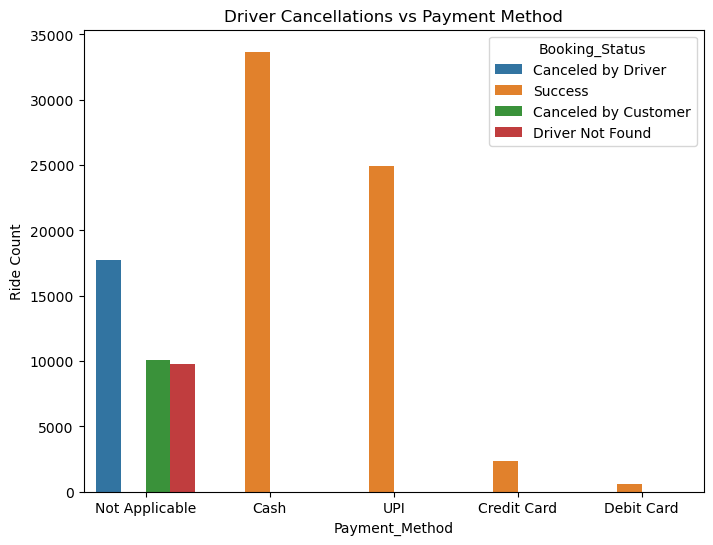

In [80]:
plt.figure(figsize=(8,6))
sns.countplot(data=df.dropna(subset=["Payment_Method"]), x="Payment_Method", hue="Booking_Status")
plt.title("Driver Cancellations vs Payment Method")
plt.ylabel("Ride Count")
plt.show()

### Driver Behavior Scorecard

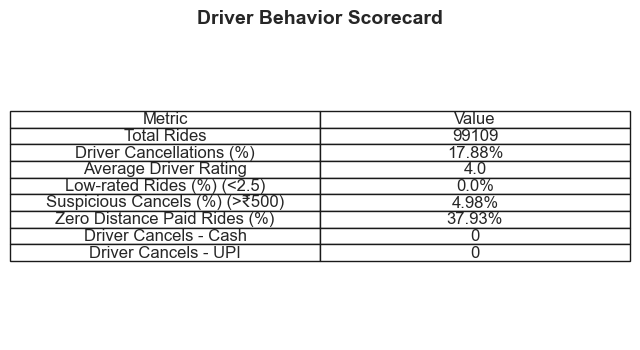

In [102]:
# --- 1️⃣ Driver Cancellation Metrics ---
total_rides = len(df)
driver_cancels = df["Canceled_Rides_by_Driver"].notna().sum()
driver_cancel_pct = round(driver_cancels / total_rides * 100, 2)

# --- 2️⃣ Driver Rating Metrics ---
avg_driver_rating = round(df["Driver_Ratings"].mean(), 2)
low_rating_rides = len(df[df["Driver_Ratings"] < 2.5])
low_rating_pct = round(low_rating_rides / total_rides * 100, 2)

# --- 3️⃣ Suspicious Patterns ---
suspicious_cancels = len(df[(df["Booking_Status"] == "Canceled by Driver") & (df["Booking_Value"] > 500)])
suspicious_cancel_pct = round(suspicious_cancels / total_rides * 100, 2)

zero_distance_paid = len(df[(df["Ride_Distance"] == 0) & (df["Booking_Value"] > 0)])
zero_distance_paid_pct = round(zero_distance_paid / total_rides * 100, 2)

# --- 4️⃣ Payment Method Bias ---
cash_cancels = len(df[(df["Booking_Status"] == "Canceled by Driver") & (df["Payment_Method"] == "Cash")])
upi_cancels = len(df[(df["Booking_Status"] == "Canceled by Driver") & (df["Payment_Method"] == "UPI")])

# --- Build Scorecard ---
driver_scorecard = pd.DataFrame({
    "Metric": [
        "Total Rides",
        "Driver Cancellations (%)",
        "Average Driver Rating",
        "Low-rated Rides (%) (<2.5)",
        "Suspicious Cancels (%) (>₹500)",
        "Zero Distance Paid Rides (%)",
        "Driver Cancels - Cash",
        "Driver Cancels - UPI"
    ],
    "Value": [
        total_rides,
        f"{driver_cancel_pct}%",
        avg_driver_rating,
        f"{low_rating_pct}%",
        f"{suspicious_cancel_pct}%",
        f"{zero_distance_paid_pct}%",
        cash_cancels,
        upi_cancels
    ]
})

import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.axis("off")
plt.table(
    cellText=driver_scorecard.values,
    colLabels=driver_scorecard.columns,
    cellLoc="center",
    loc="center"
)
plt.title("Driver Behavior Scorecard", fontsize=14, fontweight="bold")
plt.show()

In [82]:
df

,Date,Time,Booking_ID,Booking_Status,Customer_ID,Vehicle_Type,Pickup_Location,Drop_Location,V_TAT,C_TAT,Canceled_Rides_by_Customer,Canceled_Rides_by_Driver,Incomplete_Rides,Incomplete_Rides_Reason,Booking_Value,Payment_Method,Ride_Distance,Driver_Ratings,Customer_Rating,Vehicle Images,Ride_Hour,Day_of_Week,Month,Time_parsed,Ride_Day,Ride_Week,Ride_Month,Ride_Year
0,2024-07-26 14:00:00,14:00:00,CNR7153255142,Canceled by Driver,CID713523,Prime Sedan,Tumkur Road,RT Nagar,NaN,NaN,NaN,Personal & Car related issue,NaN,NaN,444,Not Applicable,0,NaN,NaN,https://cdn-icons-png.flaticon.com/128/14183/1...,14,Friday,July,14:00:00,2024-07-26,30,7,2024
1,2024-07-25 22:20:00,22:20:00,CNR2940424040,Success,CID225428,Bike,Magadi Road,Varthur,203.0,30.0,NaN,NaN,No,NaN,158,Cash,13,4.1,4.0,https://cdn-icons-png.flaticon.com/128/9983/99...,22,Thursday,July,22:20:00,2024-07-25,30,7,2024
2,2024-07-30 19:59:00,19:59:00,CNR2982357879,Success,CID270156,Prime SUV,Sahakar Nagar,Varthur,238.0,130.0,NaN,NaN,No,NaN,386,UPI,40,4.2,4.8,https://cdn-icons-png.flaticon.com/128/9983/99...,19,Tuesday,July,19:59:00,2024-07-30,31,7,2024
3,2024-07-22 03:15:00,3:15:00,CNR2395710036,Canceled by Customer,CID581320,eBike,HSR Layout,Vijayanagar,NaN,NaN,Driver is not moving towards pickup location,NaN,NaN,NaN,384,Not Applicable,0,NaN,NaN,https://cdn-icons-png.flaticon.com/128/6839/68...,3,Monday,July,03:15:00,2024-07-22,30,7,2024
4,2024-07-02 09:02:00,9:02:00,CNR1797421769,Success,CID939555,Mini,Rajajinagar,Chamarajpet,252.0,80.0,NaN,NaN,No,NaN,822,Credit Card,45,4.0,3.0,https://cdn-icons-png.flaticon.com/128/3202/32...,9,Tuesday,July,09:02:00,2024-07-02,27,7,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99104,2024-07-31 03:00:00,3:00:00,CNR9738039746,Success,CID922711,eBike,Chickpet,RT Nagar,42.0,135.0,NaN,NaN,No,NaN,310,UPI,7,3.8,3.3,https://cdn-icons-png.flaticon.com/128/6839/68...,3,Wednesday,July,03:00:00,2024-07-31,31,7,2024
99105,2024-07-31 09:06:00,9:06:00,CNR9488489435,Success,CID371654,Prime Plus,Richmond Town,Varthur,245.0,35.0,NaN,NaN,No,NaN,111,Cash,41,3.6,3.8,https://cdn-icons-png.flaticon.com/128/11409/1...,9,Wednesday,July,09:06:00,2024-07-31,31,7,2024
99106,2024-07-31 15:12:00,15:12:00,CNR3151743100,Success,CID334158,Auto,Vijayanagar,Richmond Town,84.0,145.0,NaN,NaN,No,NaN,1097,UPI,17,4.3,3.3,https://cdn-icons-png.flaticon.com/128/16526/1...,15,Wednesday,July,15:12:00,2024-07-31,31,7,2024
99107,2024-07-31 14:56:00,14:56:00,CNR2027162035,Success,CID118301,eBike,Indiranagar,Magadi Road,210.0,140.0,NaN,NaN,No,NaN,267,UPI,47,3.4,3.1,https://cdn-icons-png.flaticon.com/128/6839/68...,14,Wednesday,July,14:56:00,2024-07-31,31,7,2024


# Create Database & Table in SQLite

In [83]:
import sqlite3

# connect (or create if not exists) SQLite database
conn = sqlite3.connect("ola_rides.db")

# save dataframe as SQL table
df.to_sql("rides", conn, if_exists="replace", index=False)

print("✅ Loaded dataframe into SQLite table 'rides'")

✅ Loaded dataframe into SQLite table 'rides'


In [84]:
import pandas as pd

# example query
query = 'SELECT Booking_Status, COUNT(*) as total FROM rides GROUP BY Booking_Status;'
pd.read_sql(query, conn)

,Booking_Status,total
0,Canceled by Customer,10097
1,Canceled by Driver,17724
2,Driver Not Found,9773
3,Success,61515


# ✅ SQL Query Development (with sample queries)

1️⃣ Retrieve all successful bookings

In [85]:
query1 = """
SELECT *
FROM rides
WHERE "Booking_Status" = 'Success';
"""
pd.read_sql(query1, conn)

,Date,Time,Booking_ID,Booking_Status,Customer_ID,Vehicle_Type,Pickup_Location,Drop_Location,V_TAT,C_TAT,Canceled_Rides_by_Customer,Canceled_Rides_by_Driver,Incomplete_Rides,Incomplete_Rides_Reason,Booking_Value,Payment_Method,Ride_Distance,Driver_Ratings,Customer_Rating,Vehicle Images,Ride_Hour,Day_of_Week,Month,Time_parsed,Ride_Day,Ride_Week,Ride_Month,Ride_Year
0,2024-07-25 22:20:00,22:20:00,CNR2940424040,Success,CID225428,Bike,Magadi Road,Varthur,203.0,30.0,None,None,No,None,158,Cash,13,4.1,4.0,https://cdn-icons-png.flaticon.com/128/9983/99...,22,Thursday,July,22:20:00.000000,2024-07-25,30,7,2024
1,2024-07-30 19:59:00,19:59:00,CNR2982357879,Success,CID270156,Prime SUV,Sahakar Nagar,Varthur,238.0,130.0,None,None,No,None,386,UPI,40,4.2,4.8,https://cdn-icons-png.flaticon.com/128/9983/99...,19,Tuesday,July,19:59:00.000000,2024-07-30,31,7,2024
2,2024-07-02 09:02:00,9:02:00,CNR1797421769,Success,CID939555,Mini,Rajajinagar,Chamarajpet,252.0,80.0,None,None,No,None,822,Credit Card,45,4.0,3.0,https://cdn-icons-png.flaticon.com/128/3202/32...,9,Tuesday,July,09:02:00.000000,2024-07-02,27,7,2024
3,2024-07-13 04:42:00,4:42:00,CNR8787177882,Success,CID802429,Mini,Kadugodi,Vijayanagar,231.0,90.0,None,None,No,None,173,UPI,41,3.4,4.6,https://cdn-icons-png.flaticon.com/128/3202/32...,4,Saturday,July,04:42:00.000000,2024-07-13,28,7,2024
4,2024-07-23 09:51:00,9:51:00,CNR3612067560,Success,CID476071,Bike,Tumkur Road,Whitefield,133.0,40.0,None,None,No,None,140,Cash,49,3.2,4.5,https://cdn-icons-png.flaticon.com/128/9983/99...,9,Tuesday,July,09:51:00.000000,2024-07-23,30,7,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61510,2024-07-31 03:00:00,3:00:00,CNR9738039746,Success,CID922711,eBike,Chickpet,RT Nagar,42.0,135.0,None,None,No,None,310,UPI,7,3.8,3.3,https://cdn-icons-png.flaticon.com/128/6839/68...,3,Wednesday,July,03:00:00.000000,2024-07-31,31,7,2024
61511,2024-07-31 09:06:00,9:06:00,CNR9488489435,Success,CID371654,Prime Plus,Richmond Town,Varthur,245.0,35.0,None,None,No,None,111,Cash,41,3.6,3.8,https://cdn-icons-png.flaticon.com/128/11409/1...,9,Wednesday,July,09:06:00.000000,2024-07-31,31,7,2024
61512,2024-07-31 15:12:00,15:12:00,CNR3151743100,Success,CID334158,Auto,Vijayanagar,Richmond Town,84.0,145.0,None,None,No,None,1097,UPI,17,4.3,3.3,https://cdn-icons-png.flaticon.com/128/16526/1...,15,Wednesday,July,15:12:00.000000,2024-07-31,31,7,2024
61513,2024-07-31 14:56:00,14:56:00,CNR2027162035,Success,CID118301,eBike,Indiranagar,Magadi Road,210.0,140.0,None,None,No,None,267,UPI,47,3.4,3.1,https://cdn-icons-png.flaticon.com/128/6839/68...,14,Wednesday,July,14:56:00.000000,2024-07-31,31,7,2024


2. Find the average ride distance for each vehicle type

In [86]:
query2 = """
SELECT "Vehicle_Type", AVG("Ride_Distance") AS avg_distance
FROM rides
GROUP BY "Vehicle_Type";
"""
pd.read_sql(query2, conn)

,Vehicle_Type,avg_distance
0,Auto,6.235882
1,Bike,15.491600
2,Mini,15.566291
3,Prime Plus,15.423820
4,Prime SUV,15.290685
5,Prime Sedan,15.728749
6,eBike,15.611353


3. Total number of cancelled rides by customers

In [87]:
query3 = """
SELECT COUNT(*) AS total_customer_cancellations
FROM rides
WHERE "Booking_Status" = 'Canceled by Customer';
"""
pd.read_sql(query3, conn)

,total_customer_cancellations
0,10097


4. Top 5 customers who booked the highest number of rides

In [88]:
query4 = """
SELECT "Customer_ID", COUNT(*) AS total_rides
FROM rides
GROUP BY "Customer_ID"
ORDER BY total_rides DESC
LIMIT 5;
"""
pd.read_sql(query4, conn)

,Customer_ID,total_rides
0,CID954071,5
1,CID980727,4
2,CID969725,4
3,CID966929,4
4,CID952434,4


5. Rides cancelled by drivers due to personal and car-related issues

In [89]:
query5 = """
SELECT COUNT(*) AS driver_cancellations_personal
FROM rides
WHERE "Booking_Status" = 'Canceled by Driver'
  AND "Canceled_Rides_by_Driver" = 'Personal & Car related issue';
"""
pd.read_sql(query5, conn)

,driver_cancellations_personal
0,6280


6. Max and min driver ratings for Prime Sedan bookings

In [90]:
query6 = """
SELECT MAX("Driver_Ratings") AS max_rating,
       MIN("Driver_Ratings") AS min_rating
FROM rides
WHERE "Vehicle_Type" = 'Prime Sedan'
  AND "Driver_Ratings" IS NOT NULL;
"""
pd.read_sql(query6, conn)

,max_rating,min_rating
0,5.0,3.0


7. All rides paid using UPI

In [92]:
query7 = """
SELECT *
FROM rides
WHERE "Payment_Method" = 'UPI';
"""
pd.read_sql(query7, conn)

,Date,Time,Booking_ID,Booking_Status,Customer_ID,Vehicle_Type,Pickup_Location,Drop_Location,V_TAT,C_TAT,Canceled_Rides_by_Customer,Canceled_Rides_by_Driver,Incomplete_Rides,Incomplete_Rides_Reason,Booking_Value,Payment_Method,Ride_Distance,Driver_Ratings,Customer_Rating,Vehicle Images,Ride_Hour,Day_of_Week,Month,Time_parsed,Ride_Day,Ride_Week,Ride_Month,Ride_Year
0,2024-07-30 19:59:00,19:59:00,CNR2982357879,Success,CID270156,Prime SUV,Sahakar Nagar,Varthur,238.0,130.0,None,None,No,None,386,UPI,40,4.2,4.8,https://cdn-icons-png.flaticon.com/128/9983/99...,19,Tuesday,July,19:59:00.000000,2024-07-30,31,7,2024
1,2024-07-13 04:42:00,4:42:00,CNR8787177882,Success,CID802429,Mini,Kadugodi,Vijayanagar,231.0,90.0,None,None,No,None,173,UPI,41,3.4,4.6,https://cdn-icons-png.flaticon.com/128/3202/32...,4,Saturday,July,04:42:00.000000,2024-07-13,28,7,2024
2,2024-07-27 13:18:00,13:18:00,CNR4524472111,Success,CID540929,Auto,Cox Town,Yelahanka,126.0,35.0,None,None,No,None,330,UPI,8,3.0,4.8,https://cdn-icons-png.flaticon.com/128/16526/1...,13,Saturday,July,13:18:00.000000,2024-07-27,30,7,2024
3,2024-07-16 09:54:00,9:54:00,CNR8181602032,Success,CID167642,Bike,Indiranagar,MG Road,70.0,95.0,None,None,No,None,378,UPI,18,4.8,4.1,https://cdn-icons-png.flaticon.com/128/9983/99...,9,Tuesday,July,09:54:00.000000,2024-07-16,29,7,2024
4,2024-07-02 10:25:00,10:25:00,CNR8090918544,Success,CID640151,Bike,Magadi Road,HSR Layout,126.0,95.0,None,None,No,None,343,UPI,23,3.7,3.6,https://cdn-icons-png.flaticon.com/128/9983/99...,10,Tuesday,July,10:25:00.000000,2024-07-02,27,7,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24891,2024-07-31 19:34:00,19:34:00,CNR4870774895,Success,CID266336,Prime Sedan,Marathahalli,Cox Town,189.0,30.0,None,None,No,None,280,UPI,38,3.4,4.1,https://cdn-icons-png.flaticon.com/128/14183/1...,19,Wednesday,July,19:34:00.000000,2024-07-31,31,7,2024
24892,2024-07-31 03:00:00,3:00:00,CNR9738039746,Success,CID922711,eBike,Chickpet,RT Nagar,42.0,135.0,None,None,No,None,310,UPI,7,3.8,3.3,https://cdn-icons-png.flaticon.com/128/6839/68...,3,Wednesday,July,03:00:00.000000,2024-07-31,31,7,2024
24893,2024-07-31 15:12:00,15:12:00,CNR3151743100,Success,CID334158,Auto,Vijayanagar,Richmond Town,84.0,145.0,None,None,No,None,1097,UPI,17,4.3,3.3,https://cdn-icons-png.flaticon.com/128/16526/1...,15,Wednesday,July,15:12:00.000000,2024-07-31,31,7,2024
24894,2024-07-31 14:56:00,14:56:00,CNR2027162035,Success,CID118301,eBike,Indiranagar,Magadi Road,210.0,140.0,None,None,No,None,267,UPI,47,3.4,3.1,https://cdn-icons-png.flaticon.com/128/6839/68...,14,Wednesday,July,14:56:00.000000,2024-07-31,31,7,2024


8. Average customer rating per vehicle type

In [93]:
query8 = """
SELECT "Vehicle_Type", AVG("Customer_Rating") AS avg_rating
FROM rides
WHERE "Customer_Rating" IS NOT NULL
GROUP BY "Vehicle_Type";
"""
pd.read_sql(query8, conn)

,Vehicle_Type,avg_rating
0,Auto,3.999807
1,Bike,3.993802
2,Mini,3.995632
3,Prime Plus,4.008097
4,Prime SUV,3.998860
5,Prime Sedan,4.001989
6,eBike,3.986754


9. Total booking value of rides completed successfully

In [94]:
query9 = """
SELECT SUM("Booking_Value") AS total_success_value
FROM rides
WHERE "Booking_Status" = 'Success';
"""
pd.read_sql(query9, conn)

,total_success_value
0,28750196


10. All incomplete rides with reasons

In [95]:
# ✅ Query only incomplete rides with reasons
query = """
SELECT Booking_ID, Incomplete_Rides, Incomplete_Rides_Reason
FROM rides
WHERE Incomplete_Rides = 'Yes';
"""
incomplete_rides = pd.read_sql(query, conn)

# Show first 10 rows and total shape
print(incomplete_rides.head(10))
print("Shape:", incomplete_rides.shape)

# ✅ Optional: Count top incomplete ride reasons
reason_summary = incomplete_rides["Incomplete_Rides_Reason"].value_counts().reset_index()
reason_summary.columns = ["Reason", "Count"]
print(reason_summary)

      Booking_ID Incomplete_Rides Incomplete_Rides_Reason
0  CNR5176704322              Yes         Customer Demand
1  CNR7924302885              Yes         Customer Demand
2  CNR1640228587              Yes             Other Issue
3  CNR7623690602              Yes             Other Issue
4  CNR9590311980              Yes         Customer Demand
5  CNR5863244684              Yes         Customer Demand
6  CNR9526078867              Yes         Customer Demand
7  CNR7154043084              Yes         Customer Demand
8  CNR3193710797              Yes             Other Issue
9  CNR7073850950              Yes         Customer Demand
Shape: (3760, 3)
              Reason  Count
0    Customer Demand   1540
1  Vehicle Breakdown   1515
2        Other Issue    705


In [96]:
pd.read_sql(query2, conn)

,Vehicle_Type,avg_distance
0,Auto,6.235882
1,Bike,15.491600
2,Mini,15.566291
3,Prime Plus,15.423820
4,Prime SUV,15.290685
5,Prime Sedan,15.728749
6,eBike,15.611353


In [97]:
pd.read_sql('SELECT DISTINCT "Booking_Status" FROM rides;', conn)
pd.read_sql('SELECT DISTINCT "Payment_Method" FROM rides;', conn)
pd.read_sql('SELECT DISTINCT "Canceled_Rides_by_Driver" FROM rides;', conn)

,Canceled_Rides_by_Driver
0,Personal & Car related issue
1,None
2,Customer was coughing/sick
3,Customer related issue
4,More than permitted people in there


### Check how many columns has null value

In [103]:
# Now check for nulls
null_counts = df.isnull().sum()

# Show only columns that have at least 1 null
print(null_counts[null_counts > 0])

V_TAT                         37594
C_TAT                         37594
Canceled_Rides_by_Customer    89012
Canceled_Rides_by_Driver      81385
Incomplete_Rides              37594
Incomplete_Rides_Reason       95349
Driver_Ratings                37594
Customer_Rating               37594
dtype: int64


=== KPI SUMMARY ===
Total Rides: 99109
Successful Rides: 61515
Success Rate (%): 62.07
Total Cancellations: 37594
Cancellation Rate (%): 37.93
Avg Fare (Success, ₹): 467.37
Median Fare (Success, ₹): 374.0
Avg Distance (km, Success): 22.86
Avg Driver Rating: 4.0
Avg Customer Rating: 4.0

=== Cancellation Breakdown (counts) ===
Booking_Status
Success                 61515
Canceled by Driver      17724
Canceled by Customer    10097
Driver Not Found         9773
Name: count, dtype: int64

=== Cancellation Reasons by Driver (top values) ===
Canceled_Rides_by_Driver
None                                   81385
Personal & Car related issue            6280
Customer related issue                  5217
Customer was coughing/sick              3514
More than permitted people in there     2713
Name: count, dtype: int64

=== Cancellation Reasons by Customer (top values) ===
Canceled_Rides_by_Customer
None                                            89012
Driver is not moving towards pickup location  

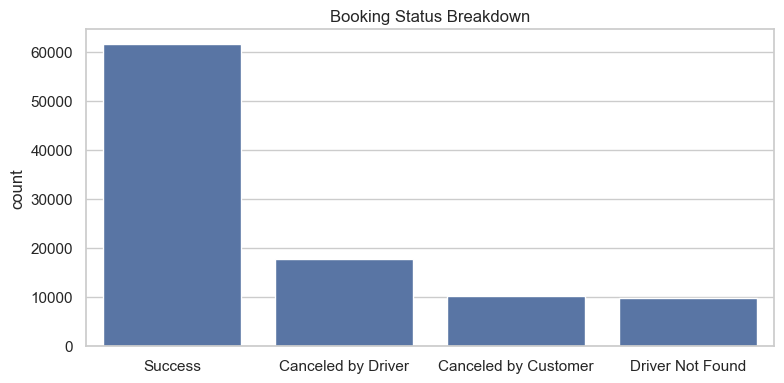

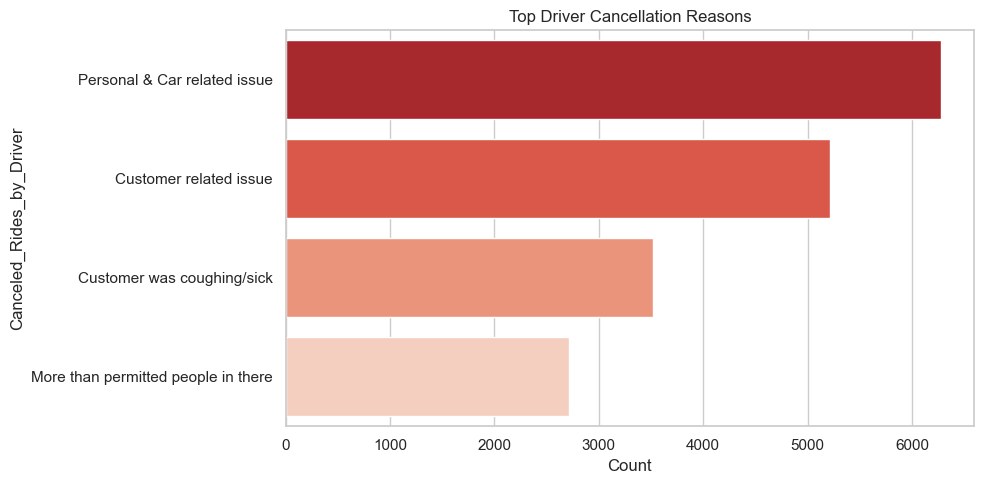

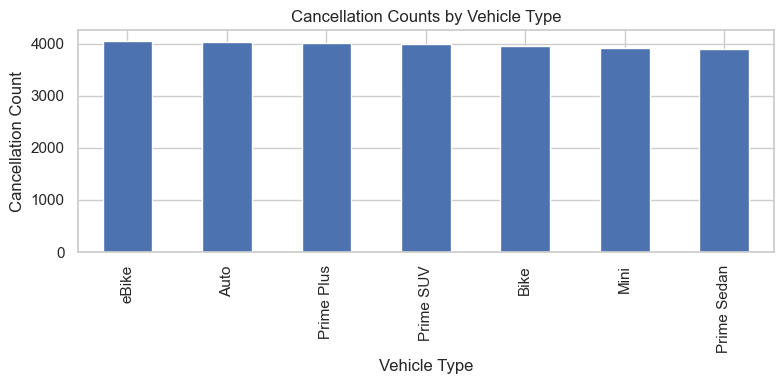

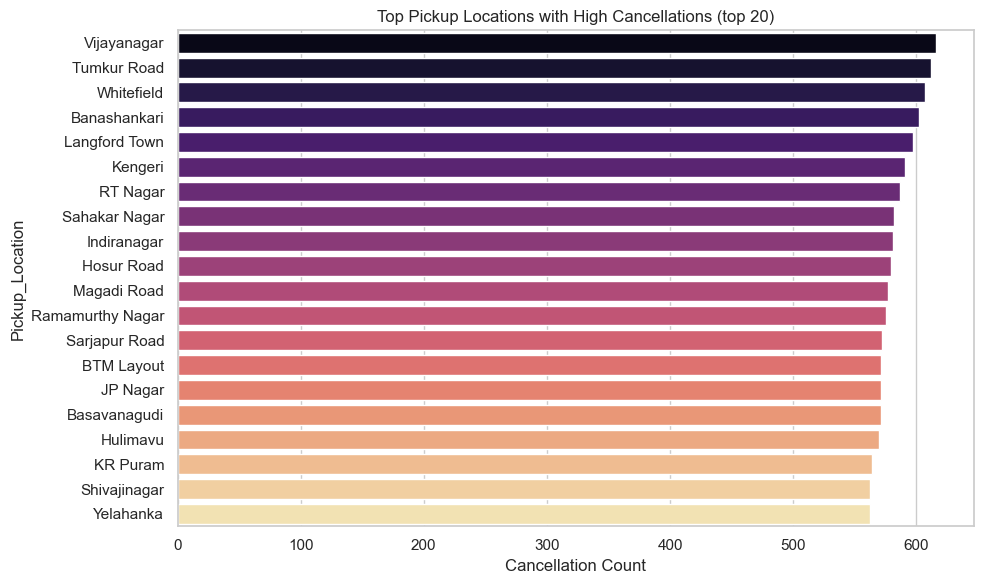

({'Total Rides': 99109,
  'Successful Rides': 61515,
  'Success Rate (%)': 62.07,
  'Total Cancellations': 37594,
  'Cancellation Rate (%)': 37.93,
  'Avg Fare (Success, ₹)': 467.37,
  'Median Fare (Success, ₹)': 374.0,
  'Avg Distance (km, Success)': 22.86,
  'Avg Driver Rating': 4.0,
  'Avg Customer Rating': 4.0},
 Booking_Status
 Success                 61515
 Canceled by Driver      17724
 Canceled by Customer    10097
 Driver Not Found         9773
 Name: count, dtype: int64,
 Canceled_Rides_by_Driver
 None                                   81385
 Personal & Car related issue            6280
 Customer related issue                  5217
 Customer was coughing/sick              3514
 More than permitted people in there     2713
 Name: count, dtype: int64,
 Canceled_Rides_by_Customer
 None                                            89012
 Driver is not moving towards pickup location     3038
 Driver asked to cancel                           2569
 Change of plans                     

In [104]:
# KPIs & Cancellations analysis (run in Jupyter)

plt.style.use('default')
sns.set_theme(style="whitegrid")

# --------------- KPI calculations ---------------
total_rides = len(df)
success_count = (df["Booking_Status"] == "Success").sum()
driver_cancels = (df["Booking_Status"] == "Canceled by Driver").sum()
customer_cancels = (df["Booking_Status"] == "Canceled by Customer").sum()
driver_not_found = (df["Booking_Status"] == "Driver Not Found").sum()

success_rate = success_count / total_rides * 100
cancellation_rate = (driver_cancels + customer_cancels + driver_not_found) / total_rides * 100
avg_fare = df.loc[df["Booking_Status"] == "Success", "Booking_Value"].mean()
median_fare = df.loc[df["Booking_Status"] == "Success", "Booking_Value"].median()
avg_distance = df.loc[df["Booking_Status"] == "Success", "Ride_Distance"].mean()
avg_driver_rating = df["Driver_Ratings"].dropna().mean()
avg_customer_rating = df["Customer_Rating"].dropna().mean()

kpi_summary = {
    "Total Rides": int(total_rides),
    "Successful Rides": int(success_count),
    "Success Rate (%)": round(success_rate, 2),
    "Total Cancellations": int(driver_cancels + customer_cancels + driver_not_found),
    "Cancellation Rate (%)": round(cancellation_rate, 2),
    "Avg Fare (Success, ₹)": round(avg_fare, 2) if not np.isnan(avg_fare) else None,
    "Median Fare (Success, ₹)": round(median_fare, 2) if not np.isnan(median_fare) else None,
    "Avg Distance (km, Success)": round(avg_distance, 2) if not np.isnan(avg_distance) else None,
    "Avg Driver Rating": round(avg_driver_rating, 2) if not np.isnan(avg_driver_rating) else None,
    "Avg Customer Rating": round(avg_customer_rating, 2) if not np.isnan(avg_customer_rating) else None
}

print("=== KPI SUMMARY ===")
for k, v in kpi_summary.items():
    print(f"{k}: {v}")

# --------------- Cancellation breakdown ---------------
print("\n=== Cancellation Breakdown (counts) ===")
cancel_breakdown = df["Booking_Status"].value_counts()
print(cancel_breakdown)

# --------------- Cancellation reasons (driver) ---------------
print("\n=== Cancellation Reasons by Driver (top values) ===")
driver_reasons = df["Canceled_Rides_by_Driver"].fillna("None").value_counts()
print(driver_reasons.head(10))

# --------------- Cancellation reasons (customer) ---------------
print("\n=== Cancellation Reasons by Customer (top values) ===")
cust_reasons = df["Canceled_Rides_by_Customer"].fillna("None").value_counts()
print(cust_reasons.head(10))

# --------------- Cancellation by vehicle type ---------------
print("\n=== Cancellation Counts by Vehicle_Type ===")
cancel_by_vehicle = df[df["Booking_Status"].str.contains("Canceled", na=False)].groupby("Vehicle_Type")["Booking_ID"].count().sort_values(ascending=False)
print(cancel_by_vehicle)

# --------------- Top Pickup Locations with cancellations ---------------
print("\n=== Top Pickup Locations by Cancellation Count (top 20) ===")
top_cancel_pickups = df[df["Booking_Status"].str.contains("Canceled", na=False)]["Pickup_Location"].value_counts().head(20)
print(top_cancel_pickups)

# --------------- Visuals ---------------
# 1) Booking Status bar chart
fig1, ax1 = plt.subplots(figsize=(8,4))
sns.countplot(data=df, x="Booking_Status", order=cancel_breakdown.index, ax=ax1)
ax1.set_title("Booking Status Breakdown")
ax1.set_xlabel("")
plt.tight_layout()
plt.show()

# 2) Driver cancellation reasons (top 8)
fig2, ax2 = plt.subplots(figsize=(10,5))
driver_reasons_top = driver_reasons[driver_reasons.index != "None"].head(8)
sns.barplot(x=driver_reasons_top.values, y=driver_reasons_top.index, ax=ax2, palette="Reds_r")
ax2.set_title("Top Driver Cancellation Reasons")
ax2.set_xlabel("Count")
plt.tight_layout()
plt.show()

# 3) Cancellation by vehicle type
fig3, ax3 = plt.subplots(figsize=(8,4))
cancel_by_vehicle.plot(kind='bar', ax=ax3)
ax3.set_title("Cancellation Counts by Vehicle Type")
ax3.set_ylabel("Cancellation Count")
ax3.set_xlabel("Vehicle Type")
plt.tight_layout()
plt.show()

# 4) Top pickup locations with cancellations (horizontal bar)
fig4, ax4 = plt.subplots(figsize=(10,6))
sns.barplot(x=top_cancel_pickups.values, y=top_cancel_pickups.index, ax=ax4, palette="magma")
ax4.set_title("Top Pickup Locations with High Cancellations (top 20)")
ax4.set_xlabel("Cancellation Count")
plt.tight_layout()
plt.show()

# Return objects if you want further processing
kpi_summary, cancel_breakdown, driver_reasons, cust_reasons, cancel_by_vehicle, top_cancel_pickups, (fig1, fig2, fig3, fig4)

In [105]:
print("=== Revenue by Vehicle Type (Top 10) ===")
revenue_vehicle = df.groupby("Vehicle_Type")["Booking_Value"].sum().sort_values(ascending=False)
print(revenue_vehicle.head(10))

print("\n=== Weekly Revenue Trends ===")
weekly_rev = df.groupby("Ride_Week")["Booking_Value"].sum().reset_index()
print(weekly_rev.head(10))  # first 10 weeks for sample

print("\n=== Distance vs Fare Correlation ===")
print("Correlation:", df["Ride_Distance"].corr(df["Booking_Value"]))

=== Revenue by Vehicle Type (Top 10) ===
Vehicle_Type
Prime Sedan    6762825
eBike          6678751
Auto           6659889
Prime SUV      6604340
Mini           6599044
Prime Plus     6572486
Bike           6546748
Name: Booking_Value, dtype: int64

=== Weekly Revenue Trends ===
   Ride_Week  Booking_Value
0         27       10457384
1         28       10553936
2         29       10452455
3         30       10457388
4         31        4502920

=== Distance vs Fare Correlation ===
Correlation: 0.00053876122768109


In [106]:
print("=== Frequent Riders (Top Ride Counts) ===")
freq_riders = df["Customer_ID"].value_counts().head(10)
print(freq_riders)

print("\n=== Top 10 High-Value Customers ===")
high_value = df.groupby("Customer_ID")["Booking_Value"].sum().sort_values(ascending=False).head(10)
print(high_value)

print("\n=== Top Vehicle Types by Ride Count ===")
vehicle_counts = df["Vehicle_Type"].value_counts()
print(vehicle_counts)

=== Frequent Riders (Top Ride Counts) ===
Customer_ID
CID954071    5
CID782883    4
CID329193    4
CID199017    4
CID201733    4
CID460299    4
CID836942    4
CID952434    4
CID189965    4
CID288207    4
Name: count, dtype: int64

=== Top 10 High-Value Customers ===
Customer_ID
CID836942    6019
CID875491    5740
CID699479    4659
CID938330    4655
CID747218    4373
CID360385    4286
CID126666    4276
CID585655    4265
CID817999    4258
CID808205    4250
Name: Booking_Value, dtype: int64

=== Top Vehicle Types by Ride Count ===
Vehicle_Type
Prime Sedan    14282
eBike          14234
Auto           14202
Prime SUV      14139
Prime Plus     14131
Bike           14107
Mini           14014
Name: count, dtype: int64


In [107]:
print("=== Top 10 Customers by Ride Cancellations ===")
cancel_customers = df[df["Booking_Status"].str.contains("Canceled")]["Customer_ID"].value_counts().head(10)
print(cancel_customers)

print("\n=== Distribution of Driver Ratings ===")
print(df["Driver_Ratings"].value_counts().sort_index())

print("\n=== Cancellation Hotspots (Top 15 Pickup Locations) ===")
cancel_hotspots = df[df["Booking_Status"].str.contains("Canceled")]["Pickup_Location"].value_counts().head(15)
print(cancel_hotspots)

print("\n=== Cancellation Trend Over Time ===")
daily_cancel = df[df["Booking_Status"].str.contains("Canceled")].groupby("Ride_Day")["Booking_ID"].count()
print(daily_cancel.head(15))  # first 15 days for sample

=== Top 10 Customers by Ride Cancellations ===
Customer_ID
CID460299    4
CID378539    3
CID993778    3
CID861160    3
CID365812    3
CID875491    3
CID833100    3
CID891417    3
CID969725    3
CID699479    3
Name: count, dtype: int64

=== Distribution of Driver Ratings ===
Driver_Ratings
3.0    1485
3.1    3151
3.2    3053
3.3    3121
3.4    3009
3.5    3105
3.6    3001
3.7    3073
3.8    3175
3.9    3145
4.0    3040
4.1    3112
4.2    3159
4.3    3061
4.4    3074
4.5    3077
4.6    3045
4.7    3106
4.8    3078
4.9    2973
5.0    1472
Name: count, dtype: int64

=== Cancellation Hotspots (Top 15 Pickup Locations) ===
Pickup_Location
Vijayanagar         616
Tumkur Road         612
Whitefield          607
Banashankari        602
Langford Town       597
Kengeri             591
RT Nagar            587
Sahakar Nagar       582
Indiranagar         581
Hosur Road          579
Magadi Road         577
Ramamurthy Nagar    575
Sarjapur Road       572
BTM Layout          571
JP Nagar            571

In [108]:
df

,Date,Time,Booking_ID,Booking_Status,Customer_ID,Vehicle_Type,Pickup_Location,Drop_Location,V_TAT,C_TAT,Canceled_Rides_by_Customer,Canceled_Rides_by_Driver,Incomplete_Rides,Incomplete_Rides_Reason,Booking_Value,Payment_Method,Ride_Distance,Driver_Ratings,Customer_Rating,Vehicle Images,Ride_Hour,Day_of_Week,Month,Time_parsed,Ride_Day,Ride_Week,Ride_Month,Ride_Year
0,2024-07-26 14:00:00,14:00:00,CNR7153255142,Canceled by Driver,CID713523,Prime Sedan,Tumkur Road,RT Nagar,NaN,NaN,NaN,Personal & Car related issue,NaN,NaN,444,Not Applicable,0,NaN,NaN,https://cdn-icons-png.flaticon.com/128/14183/1...,14,Friday,July,14:00:00,2024-07-26,30,7,2024
1,2024-07-25 22:20:00,22:20:00,CNR2940424040,Success,CID225428,Bike,Magadi Road,Varthur,203.0,30.0,NaN,NaN,No,NaN,158,Cash,13,4.1,4.0,https://cdn-icons-png.flaticon.com/128/9983/99...,22,Thursday,July,22:20:00,2024-07-25,30,7,2024
2,2024-07-30 19:59:00,19:59:00,CNR2982357879,Success,CID270156,Prime SUV,Sahakar Nagar,Varthur,238.0,130.0,NaN,NaN,No,NaN,386,UPI,40,4.2,4.8,https://cdn-icons-png.flaticon.com/128/9983/99...,19,Tuesday,July,19:59:00,2024-07-30,31,7,2024
3,2024-07-22 03:15:00,3:15:00,CNR2395710036,Canceled by Customer,CID581320,eBike,HSR Layout,Vijayanagar,NaN,NaN,Driver is not moving towards pickup location,NaN,NaN,NaN,384,Not Applicable,0,NaN,NaN,https://cdn-icons-png.flaticon.com/128/6839/68...,3,Monday,July,03:15:00,2024-07-22,30,7,2024
4,2024-07-02 09:02:00,9:02:00,CNR1797421769,Success,CID939555,Mini,Rajajinagar,Chamarajpet,252.0,80.0,NaN,NaN,No,NaN,822,Credit Card,45,4.0,3.0,https://cdn-icons-png.flaticon.com/128/3202/32...,9,Tuesday,July,09:02:00,2024-07-02,27,7,2024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99104,2024-07-31 03:00:00,3:00:00,CNR9738039746,Success,CID922711,eBike,Chickpet,RT Nagar,42.0,135.0,NaN,NaN,No,NaN,310,UPI,7,3.8,3.3,https://cdn-icons-png.flaticon.com/128/6839/68...,3,Wednesday,July,03:00:00,2024-07-31,31,7,2024
99105,2024-07-31 09:06:00,9:06:00,CNR9488489435,Success,CID371654,Prime Plus,Richmond Town,Varthur,245.0,35.0,NaN,NaN,No,NaN,111,Cash,41,3.6,3.8,https://cdn-icons-png.flaticon.com/128/11409/1...,9,Wednesday,July,09:06:00,2024-07-31,31,7,2024
99106,2024-07-31 15:12:00,15:12:00,CNR3151743100,Success,CID334158,Auto,Vijayanagar,Richmond Town,84.0,145.0,NaN,NaN,No,NaN,1097,UPI,17,4.3,3.3,https://cdn-icons-png.flaticon.com/128/16526/1...,15,Wednesday,July,15:12:00,2024-07-31,31,7,2024
99107,2024-07-31 14:56:00,14:56:00,CNR2027162035,Success,CID118301,eBike,Indiranagar,Magadi Road,210.0,140.0,NaN,NaN,No,NaN,267,UPI,47,3.4,3.1,https://cdn-icons-png.flaticon.com/128/6839/68...,14,Wednesday,July,14:56:00,2024-07-31,31,7,2024
